<a href="https://colab.research.google.com/github/pogoreli/CNC_mill_wear_detection/blob/main/training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [62]:
import tensorflow as tf
import pandas as pd
from scipy.fft import fft, fftfreq
import numpy as np
import glob
from google.colab import drive
from tabulate import tabulate
import os
import matplotlib.pyplot as plt

In [47]:
drive.mount('/content/drive', force_remount=True)

# Define the file path pattern
file_path_pattern = '/content/drive/MyDrive/Projects/CNC/CNC_mill/data/experiment_*.csv'

# Use glob to find all matching files
file_paths = glob.glob(file_path_pattern)

# Load all files into a list of DataFrames
dataframes = [pd.read_csv(file_path) for file_path in sorted(file_paths)]

labels = pd.read_csv('/content/drive/MyDrive/Projects/CNC/CNC_mill/data/train.csv')

Mounted at /content/drive


In [48]:
sample_lenght = 400
overlap = 0.7
overlap_length = int(sample_lenght * overlap)

In [49]:
def calculate_fft(time, time_series_data):
    time_np = time.to_numpy()
    time_series_data_np = time_series_data.to_numpy()

    fourier_real = np.real(fft(time_series_data_np))
    fourier_imag = np.imag(fft(time_series_data_np))

    real_pd = pd.Series(fourier_real)
    imag_pd = pd.Series(fourier_imag)

    return real_pd, imag_pd

In [50]:
def create_chunks_with_labels(df, sample_length, overlap_length, file_number):
    chunks = []
    labels_list = []
    start = 0

    while start < len(df):
        # Select chunk and check if its length is >= sample_length
        end = start + sample_length
        chunk = df.iloc[start:end]

        # Skip the last chunk if it's shorter than sample_length
        if len(chunk) < sample_length:
            break

        output_table = pd.DataFrame()
        labels_table = pd.DataFrame(index=[0])

        chunk = chunk.reset_index(drop=True)

        time = np.linspace(0, (len(chunk) - 1) * 0.1, len(chunk))
        output_table['time'] = time

        # Processing position values
        output_table['X_position_error'] = chunk['X1_ActualPosition'] - chunk['X1_CommandPosition']


        # print('Actual:')
        # print(chunk['X1_ActualPosition'])
        # print('Command:')
        # print(chunk['X1_CommandPosition'])
        # print('Error:')
        # print(output_table['X_position_error'])

        output_table['Y_position_error'] = chunk['Y1_ActualPosition'] - chunk['Y1_CommandPosition']
        output_table['Z_position_error'] = chunk['Z1_ActualPosition'] - chunk['Z1_CommandPosition']
        output_table['S_position_error'] = chunk['S1_ActualPosition'] - chunk['S1_CommandPosition']


        output_table['X_fourier_position_error_real'], output_table['X_fourier_position_error_imag'] = calculate_fft(output_table['time'], output_table['X_position_error'])
        output_table['Y_fourier_position_error_real'], output_table['Y_fourier_position_error_imag'] = calculate_fft(output_table['time'], output_table['Y_position_error'])
        output_table['Z_fourier_position_error_real'], output_table['Z_fourier_position_error_imag'] = calculate_fft(output_table['time'], output_table['Z_position_error'])
        output_table['S_fourier_position_error_real'], output_table['S_fourier_position_error_imag'] = calculate_fft(output_table['time'], output_table['S_position_error'])

        # Calculating fourier of velocity error
        output_table['X_velocity'] = chunk['X1_ActualVelocity']
        output_table['Y_velocity'] = chunk['Y1_ActualVelocity']
        output_table['Z_velocity'] = chunk['Z1_ActualVelocity']
        output_table['S_velocity'] = chunk['S1_ActualVelocity']

        output_table['X_velocity_error'] = chunk['X1_ActualVelocity'] - chunk['X1_CommandVelocity']
        output_table['Y_velocity_error'] = chunk['Y1_ActualVelocity'] - chunk['Y1_CommandVelocity']
        output_table['Z_velocity_error'] = chunk['Z1_ActualVelocity'] - chunk['Z1_CommandVelocity']
        output_table['S_velocity_error'] = chunk['S1_ActualVelocity'] - chunk['S1_CommandVelocity']

        output_table['X_fourier_velocity_error_real'], output_table['X_fourier_velocity_error_imag'] = calculate_fft(output_table['time'], output_table['X_velocity_error'])
        output_table['Y_fourier_velocity_error_real'], output_table['Y_fourier_velocity_error_imag'] = calculate_fft(output_table['time'], output_table['Y_velocity_error'])
        output_table['Z_fourier_velocity_error_real'], output_table['Z_fourier_velocity_error_imag'] = calculate_fft(output_table['time'], output_table['Z_velocity_error'])
        output_table['S_fourier_velocity_error_real'], output_table['S_fourier_velocity_error_imag'] = calculate_fft(output_table['time'], output_table['S_velocity_error'])

        # Calculating fourier of acceleration error
        output_table['X_acceleration'] = chunk['X1_ActualAcceleration']
        output_table['Y_acceleration'] = chunk['Y1_ActualAcceleration']
        output_table['Z_acceleration'] = chunk['Z1_ActualAcceleration']
        output_table['S_acceleration'] = chunk['S1_ActualAcceleration']

        output_table['X_acceleration_error'] = chunk['X1_ActualAcceleration'] - chunk['X1_CommandAcceleration']
        output_table['Y_acceleration_error'] = chunk['Y1_ActualAcceleration'] - chunk['Y1_CommandAcceleration']
        output_table['Z_acceleration_error'] = chunk['Z1_ActualAcceleration'] - chunk['Z1_CommandAcceleration']
        output_table['S_acceleration_error'] = chunk['S1_ActualAcceleration'] - chunk['S1_CommandAcceleration']

        output_table['X_fourier_acceleration_error_real'], output_table['X_fourier_acceleration_error_imag'] = calculate_fft(output_table['time'], output_table['X_acceleration_error'])
        output_table['Y_fourier_acceleration_error_real'], output_table['Y_fourier_acceleration_error_imag'] = calculate_fft(output_table['time'], output_table['Y_acceleration_error'])
        output_table['Z_fourier_acceleration_error_real'], output_table['Z_fourier_acceleration_error_imag'] = calculate_fft(output_table['time'], output_table['Z_acceleration_error'])
        output_table['S_fourier_acceleration_error_real'], output_table['S_fourier_acceleration_error_imag'] = calculate_fft(output_table['time'], output_table['S_acceleration_error'])

        # X1_DCBusVoltage
        # X1_OutputCurrent
        # X1_OutputVoltage
        # X1_OutputPower

        # Calculation fft of DC bus voltage
        output_table['X_DCBusVoltage'] = chunk['X1_DCBusVoltage']
        output_table['Y_DCBusVoltage'] = chunk['Y1_DCBusVoltage']
        output_table['Z_DCBusVoltage'] = chunk['Z1_DCBusVoltage']
        output_table['S_DCBusVoltage'] = chunk['S1_DCBusVoltage']

        output_table['X_fourier_DCBusVoltage_real'], output_table['X_fourier_DCBusVoltage_imag'] = calculate_fft(output_table['time'], output_table['X_DCBusVoltage'])
        output_table['Y_fourier_DCBusVoltage_real'], output_table['Y_fourier_DCBusVoltage_imag'] = calculate_fft(output_table['time'], output_table['Y_DCBusVoltage'])
        output_table['Z_fourier_DCBusVoltage_real'], output_table['Z_fourier_DCBusVoltage_imag'] = calculate_fft(output_table['time'], output_table['Z_DCBusVoltage'])
        output_table['S_fourier_DCBusVoltage_real'], output_table['S_fourier_DCBusVoltage_imag'] = calculate_fft(output_table['time'], output_table['S_DCBusVoltage'])

        # Calculating fft of output voltage
        output_table['X_voltage'] = chunk['X1_OutputVoltage']
        output_table['Y_voltage'] = chunk['Y1_OutputVoltage']
        output_table['Z_voltage'] = chunk['Z1_OutputVoltage']
        output_table['S_voltage'] = chunk['S1_OutputVoltage']

        output_table['X_fourier_voltage_real'], output_table['X_fourier_voltage_imag'] = calculate_fft(output_table['time'], output_table['X_voltage'])
        output_table['Y_fourier_voltage_real'], output_table['Y_fourier_voltage_imag'] = calculate_fft(output_table['time'], output_table['Y_voltage'])
        output_table['Z_fourier_voltage_real'], output_table['Z_fourier_voltage_imag'] = calculate_fft(output_table['time'], output_table['Z_voltage'])
        output_table['S_fourier_voltage_real'], output_table['S_fourier_voltage_imag'] = calculate_fft(output_table['time'], output_table['S_voltage'])

        # Calculating fft of output current
        output_table['X_current'] = chunk['X1_OutputCurrent']
        output_table['Y_current'] = chunk['Y1_OutputCurrent']
        output_table['Z_current'] = chunk['Z1_OutputCurrent']
        output_table['S_current'] = chunk['S1_OutputCurrent']

        output_table['X_fourier_current_real'], output_table['X_fourier_current_imag'] = calculate_fft(output_table['time'], output_table['X_current'])
        output_table['Y_fourier_current_real'], output_table['Y_fourier_current_imag'] = calculate_fft(output_table['time'], output_table['Y_current'])
        output_table['Z_fourier_current_real'], output_table['Z_fourier_current_imag'] = calculate_fft(output_table['time'], output_table['Z_current'])
        output_table['S_fourier_current_real'], output_table['S_fourier_current_imag'] = calculate_fft(output_table['time'], output_table['S_current'])

        # Calculating fft of output power
        output_table['X_power'] = chunk['X1_OutputPower']
        output_table['Y_power'] = chunk['Y1_OutputPower']
        output_table['Z_power'] = chunk['Z1_OutputVoltage'] * chunk['Z1_OutputCurrent']
        output_table['S_power'] = chunk['S1_OutputPower']

        output_table['X_fourier_power_real'], output_table['X_fourier_power_imag'] = calculate_fft(output_table['time'], output_table['X_power'])
        output_table['Y_fourier_power_real'], output_table['Y_fourier_power_imag'] = calculate_fft(output_table['time'], output_table['Y_power'])
        output_table['Z_fourier_power_real'], output_table['Z_fourier_power_imag'] = calculate_fft(output_table['time'], output_table['Z_power'])
        output_table['S_fourier_power_real'], output_table['S_fourier_power_imag'] = calculate_fft(output_table['time'], output_table['S_power'])

        # Calculating S inertia ffc
        output_table['S_inertia'] = chunk['S1_SystemInertia']

        output_table['S_fourier_inertia_real'], output_table['S_fourier_inertia_imag'] = calculate_fft(output_table['time'], output_table['S_inertia'])

        output_table['in_work'] = chunk['Machining_Process'].isin(
            ['Layer 1 Down', 'Layer 2 Down', 'Layer 3 Down']
        ).astype(int)

        # print()
        # print(tabulate(chunk.head(5), headers='keys', tablefmt='grid'))
        # print(tabulate(output_table.head(5), headers='keys', tablefmt='grid'))

        # Store the chunk and associated label
        chunks.append(output_table)


        machining_finalized = labels.loc[file_number, 'machining_finalized']
        passed_visual_inspection = labels.loc[file_number, 'passed_visual_inspection']

        labels_table['passed_visual_inspection'] = 1 if passed_visual_inspection == 'yes' else 0
        labels_table['machining_finalized'] = 1 if machining_finalized == 'yes' else 0


        labels_list.append(labels_table)

        # Move start index by overlap amount
        start += (sample_length - overlap_length)

    return chunks, labels_list

In [51]:
# Process all dataframes and prepare data for TensorFlow
all_chunks = []
all_labels = []
for i, df in enumerate(dataframes):
    # Retrieve corresponding label for this dataframe (assuming labels are in order and correspond 1:1 to dataframes)
    # label_value = labels.iloc[i]['label_column']  # Change 'label_column' to the actual column name for labels
    chunks, labels_list = create_chunks_with_labels(df, sample_lenght, overlap_length, i)
    all_chunks.extend(chunks)
    all_labels.extend(labels_list)

In [52]:
# import matplotlib.pyplot as plt

# # Function to plot data from a chunk
# def plot_chunk(chunk, chunk_index):
#     plt.figure(figsize=(12, 6))
#     plt.plot(chunk['time'], chunk['X_position_error'], label='X Position Error')
#     plt.plot(chunk['time'], chunk['Y_position_error'], label='Y Position Error')
#     plt.plot(chunk['time'], chunk['Z_position_error'], label='Z Position Error')
#     plt.plot(chunk['time'], chunk['S_position_error'], label='S Position Error')
#     plt.title(f'Position Errors for Chunk {chunk_index}')
#     plt.xlabel('Time')
#     plt.ylabel('Position Error')
#     plt.legend()
#     plt.show()

# # Visualize the first 3 chunks
# print("Visualizing the first 3 chunks:")
# for i, chunk in enumerate(all_chunks[:3]):
#     plot_chunk(chunk, i+1)

# # Visualize the last 3 chunks
# print("Visualizing the last 3 chunks:")
# total_chunks = len(all_chunks)
# for i, chunk in enumerate(all_chunks[-3:], start=total_chunks - 2):
#     plot_chunk(chunk, i)


In [53]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy.fft import fftfreq

# # Function to plot the Fourier transform of position errors for a chunk
# def plot_fourier_chunk(chunk, chunk_index, sample_spacing=0.1):
#     # Reconstruct the complex Fourier transforms for position errors
#     X_fft = chunk['X_fourier_position_error_real'] + 1j * chunk['X_fourier_position_error_imag']
#     Y_fft = chunk['Y_fourier_position_error_real'] + 1j * chunk['Y_fourier_position_error_imag']
#     Z_fft = chunk['Z_fourier_position_error_real'] + 1j * chunk['Z_fourier_position_error_imag']
#     S_fft = chunk['S_fourier_position_error_real'] + 1j * chunk['S_fourier_position_error_imag']

#     # Compute the magnitude of the Fourier transforms
#     X_fft_magnitude = np.abs(X_fft)
#     Y_fft_magnitude = np.abs(Y_fft)
#     Z_fft_magnitude = np.abs(Z_fft)
#     S_fft_magnitude = np.abs(S_fft)

#     # Compute the frequency bins
#     N = len(chunk['time'])
#     freq = fftfreq(N, d=sample_spacing)

#     # Since FFT results are symmetric, take only the positive frequencies
#     mask = freq >= 0
#     freq = freq[mask]
#     X_fft_magnitude = X_fft_magnitude[mask]
#     Y_fft_magnitude = Y_fft_magnitude[mask]
#     Z_fft_magnitude = Z_fft_magnitude[mask]
#     S_fft_magnitude = S_fft_magnitude[mask]

#     # Plot the magnitude of the Fourier transforms
#     plt.figure(figsize=(12, 6))
#     plt.plot(freq, X_fft_magnitude, label='X Position Error FFT Magnitude')
#     plt.plot(freq, Y_fft_magnitude, label='Y Position Error FFT Magnitude')
#     plt.plot(freq, Z_fft_magnitude, label='Z Position Error FFT Magnitude')
#     plt.plot(freq, S_fft_magnitude, label='S Position Error FFT Magnitude')
#     plt.title(f'FFT Magnitude of Position Errors for Chunk {chunk_index}')
#     plt.xlabel('Frequency [Hz]')
#     plt.ylabel('FFT Magnitude')
#     plt.legend()
#     plt.show()

# # Visualize the Fourier transforms for the first 3 chunks
# print("Visualizing the Fourier transforms:")
# for i, chunk in enumerate(all_chunks):
#     plot_fourier_chunk(chunk, i+1)



In [54]:
# from tabulate import tabulate

# for chunk in all_chunks:
#   print(tabulate(chunk.head(5), headers='keys', tablefmt='grid'))

In [55]:
# # Convert all chunks to TensorFlow dataset
# # Separate time series data and labels
# time_series_data = [chunk[0] for chunk in all_chunks]
# labels = [chunk[1] for chunk in all_chunks]

# # Convert to TensorFlow dataset
# dataset = tf.data.Dataset.from_tensor_slices((time_series_data, labels))

# # Optionally, save dataset as a TFRecord file
# def serialize_example(features, label):
#     feature = {
#         'time_series_data': tf.train.Feature(float_list=tf.train.FloatList(value=features.flatten())),
#         'label': tf.train.Feature(float_list=tf.train.FloatList(value=[label]))
#     }
#     example_proto = tf.train.Example(features=tf.train.Features(feature=feature))
#     return example_proto.SerializeToString()

# # Save TFRecord
# tfrecord_path = "/content/drive/MyDrive/Projects/CNC/CNC_mill/data/processed_data.tfrecord"
# with tf.io.TFRecordWriter(tfrecord_path) as writer:
#     for features, label in zip(time_series_data, labels):
#         serialized_example = serialize_example(features, label)
#         writer.write(serialized_example)

# print(f"Data saved to {tfrecord_path}")

In [56]:
# List to store the NumPy arrays of each chunk
chunk_arrays = []
labels_array = []

for chunk in all_chunks:
    # Convert the entire DataFrame to a NumPy array
    # This includes all columns (features)
    chunk_array = chunk.to_numpy()
    chunk_arrays.append(chunk_array)

for label in all_labels:
    label_array = label.to_numpy()
    labels_array.append(label_array)

labels_combined = np.vstack(labels_array)
labels_tensor = tf.convert_to_tensor(labels_combined, dtype=tf.int32)
# print(labels_tensor)

# labels_df = pd.DataFrame(labels_combined, columns=['passed_visual_inspection', 'machining_finalized'])
# print(tabulate(labels_df, headers='keys', tablefmt='psql'))

# Stack the arrays into a single 3D NumPy array
data_array = np.stack(chunk_arrays)  # Shape: [number of samples, time steps, features]
# print(f"Data array shape: {data_array.shape}")
data_tensor = tf.convert_to_tensor(data_array, dtype=tf.float32)
# print(data_tensor)

In [57]:
import tensorflow as tf

dataset = tf.data.Dataset.from_tensor_slices((data_tensor, labels_tensor))

# Shuffle the dataset
dataset = dataset.shuffle(buffer_size=len(data_tensor), seed=42)

# Calculate the split sizes
num_samples = len(data_tensor)
train_size = int(0.8 * num_samples)
val_size = num_samples - train_size

# Split the dataset
train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size)

# Batch the datasets
batch_size = 10
train_dataset = train_dataset.batch(batch_size)
val_dataset = val_dataset.batch(batch_size)

In [66]:
# Define the model with an RNN layer
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(data_array.shape[1], data_array.shape[2])),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(3000, return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(1000, return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(700, return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(700, return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(700, return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(700, return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(700, return_sequences=True),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.LSTM(700, return_sequences=False),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(700, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(500, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(300, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(50, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(30, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(2, activation='sigmoid')
])

# Compile the model
model.compile(
    optimizer='rmsprop',
    loss='binary_crossentropy',
    metrics=['tf.keras.metrics.AUC()']
)

Epoch 1/150
Validation Batch 4/4
Train Loss: 0.5025, Train Accuracy: 0.8516
Validation Loss: 0.2069, Validation Accuracy: 0.9531


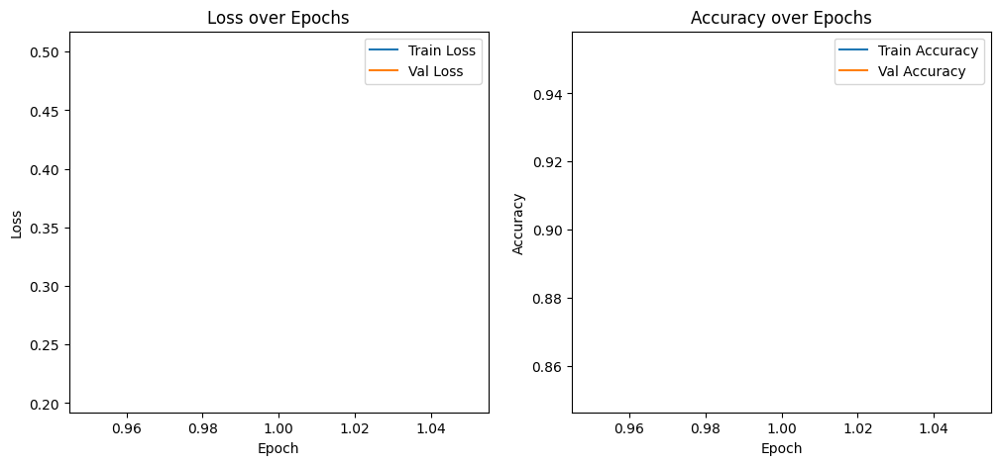

New best model saved to /content/drive/MyDrive/Projects/CNC/CNC_mill/models/best_model_epoch_01.keras
Epoch 2/150
Validation Batch 4/4
Train Loss: 0.3747, Train Accuracy: 0.8789
Validation Loss: 0.4463, Validation Accuracy: 0.8438


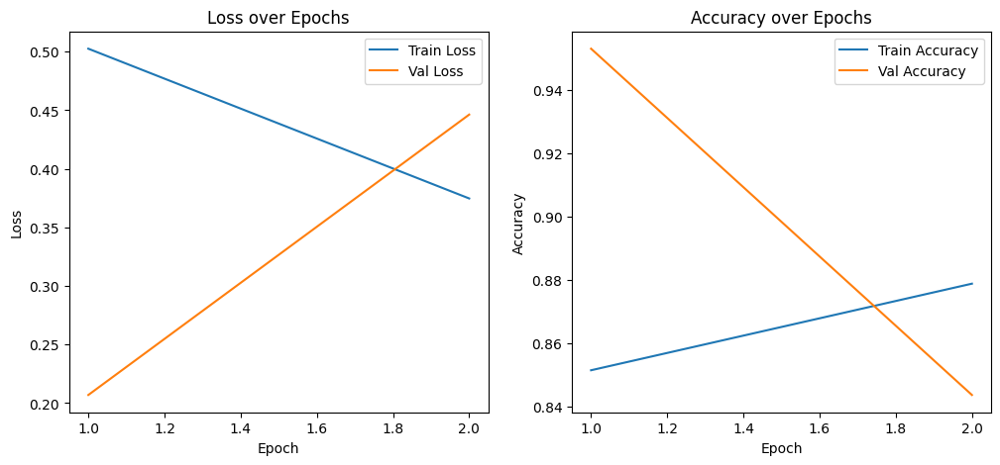

Epoch 3/150
Validation Batch 4/4
Train Loss: 0.4114, Train Accuracy: 0.8984
Validation Loss: 0.2371, Validation Accuracy: 0.9219


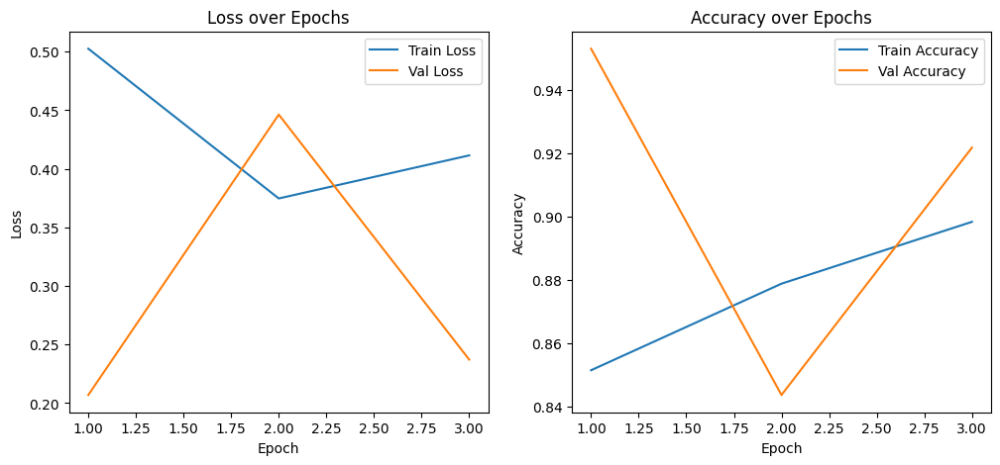

Epoch 4/150
Validation Batch 4/4
Train Loss: 0.3778, Train Accuracy: 0.8945
Validation Loss: 0.4149, Validation Accuracy: 0.8594


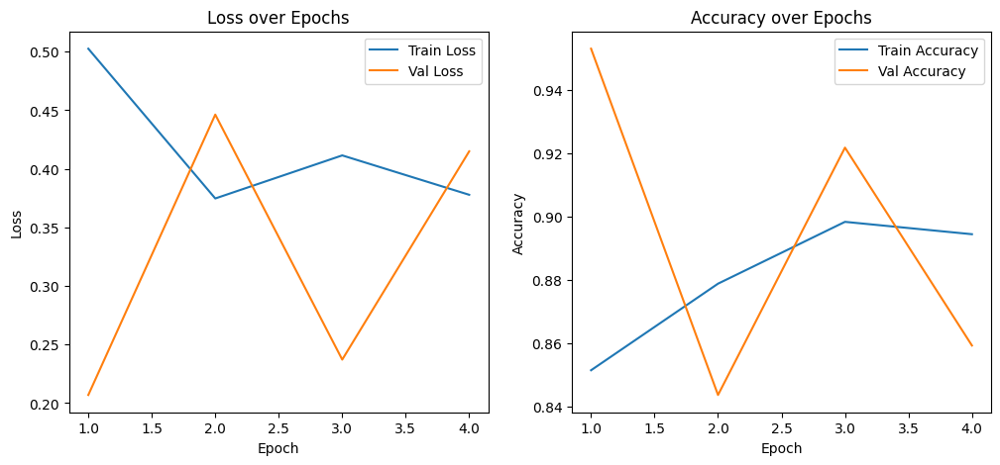

Epoch 5/150
Validation Batch 4/4
Train Loss: 0.3865, Train Accuracy: 0.8906
Validation Loss: 0.4080, Validation Accuracy: 0.9062


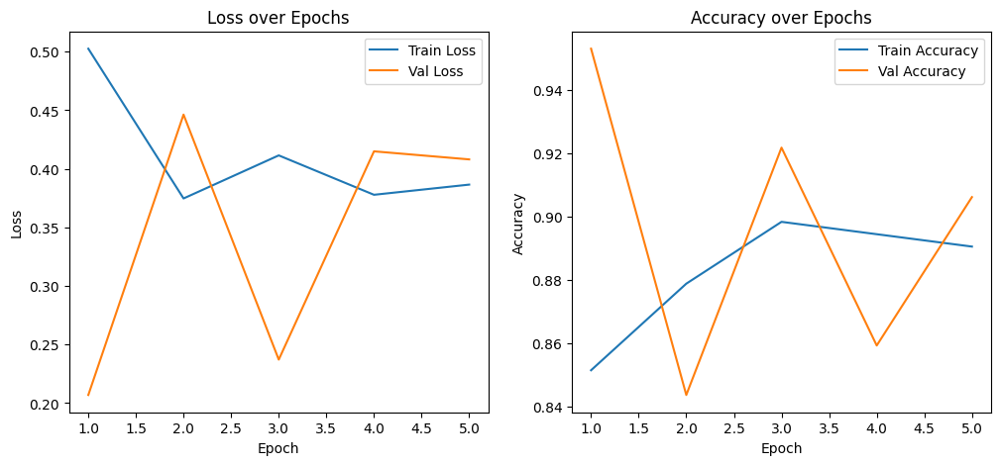

Epoch 6/150
Validation Batch 4/4
Train Loss: 0.4309, Train Accuracy: 0.8672
Validation Loss: 0.3476, Validation Accuracy: 0.8906


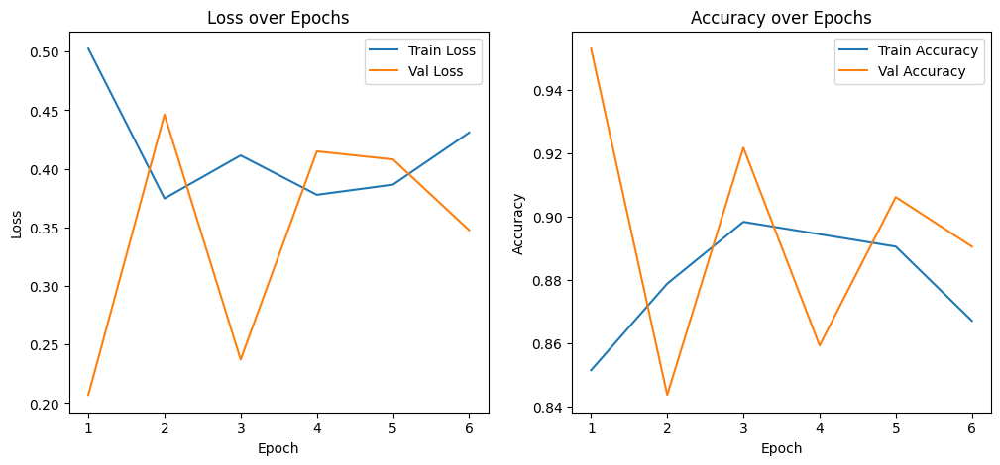

Epoch 7/150
Validation Batch 4/4
Train Loss: 0.3806, Train Accuracy: 0.8906
Validation Loss: 0.3491, Validation Accuracy: 0.8906


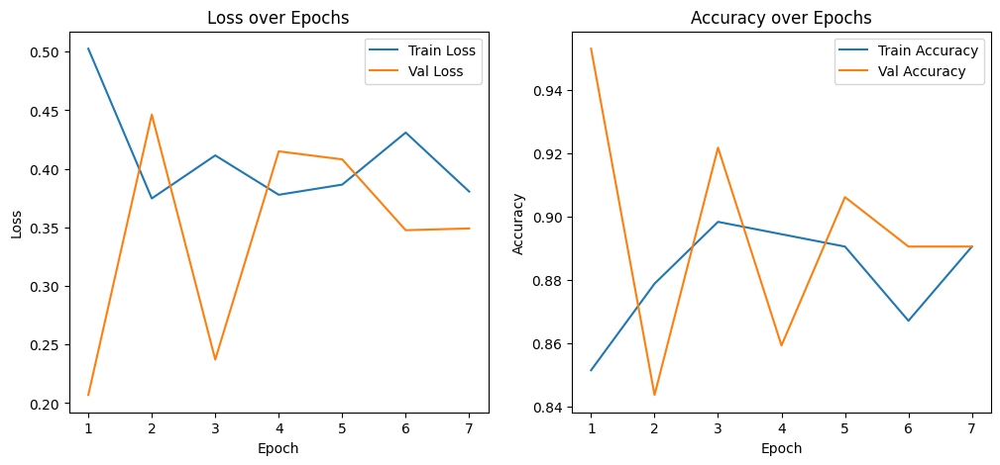

Epoch 8/150
Validation Batch 4/4
Train Loss: 0.3776, Train Accuracy: 0.8828
Validation Loss: 0.3117, Validation Accuracy: 0.8906


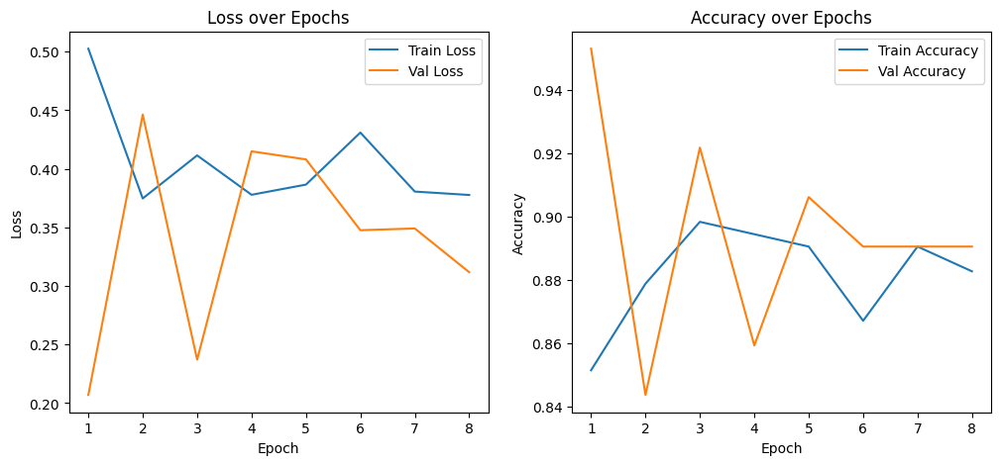

Epoch 9/150
Validation Batch 4/4
Train Loss: 0.4537, Train Accuracy: 0.8711
Validation Loss: 0.4100, Validation Accuracy: 0.8594


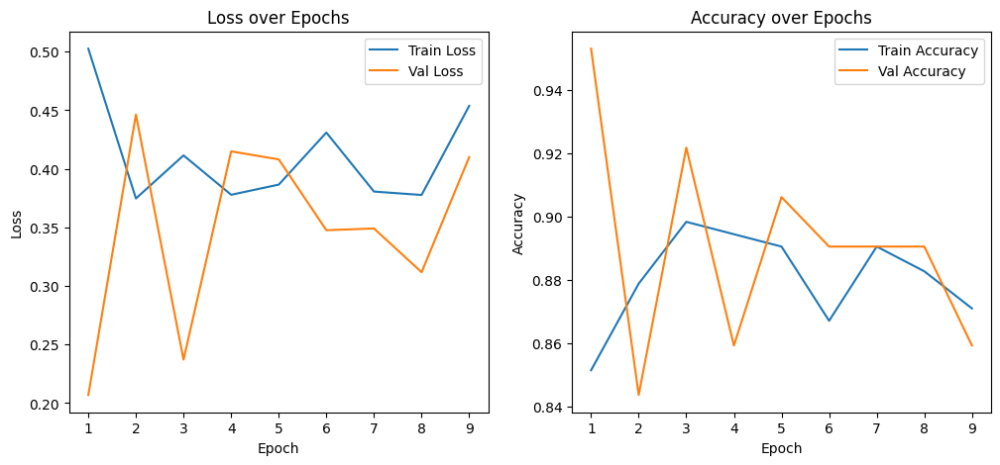

Epoch 10/150
Validation Batch 4/4
Train Loss: 0.3853, Train Accuracy: 0.8945
Validation Loss: 0.3408, Validation Accuracy: 0.8750


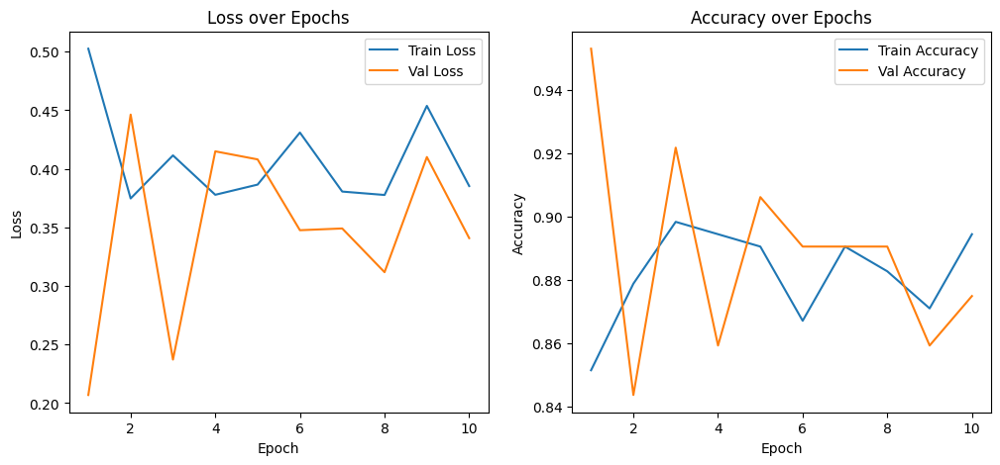

Epoch 11/150
Validation Batch 4/4
Train Loss: 0.3784, Train Accuracy: 0.8945
Validation Loss: 0.2494, Validation Accuracy: 0.9062


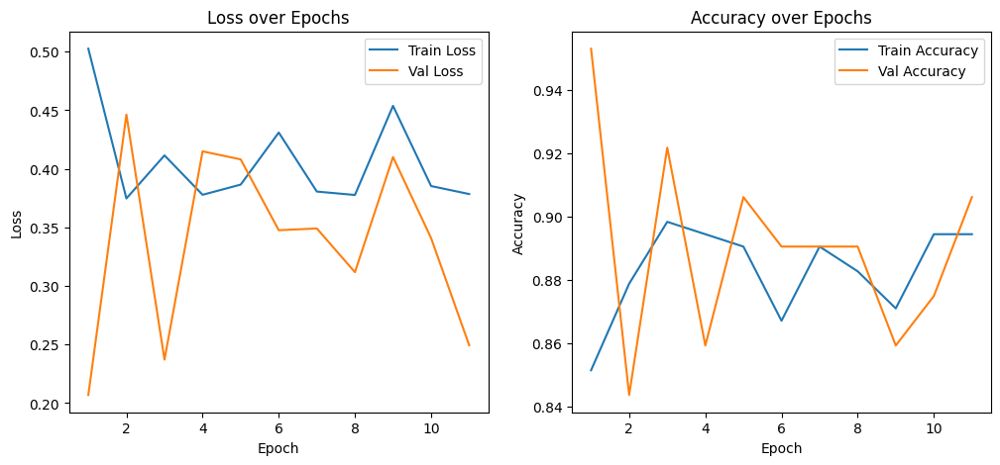

Epoch 12/150
Validation Batch 4/4
Train Loss: 0.3502, Train Accuracy: 0.8906
Validation Loss: 0.3242, Validation Accuracy: 0.9062


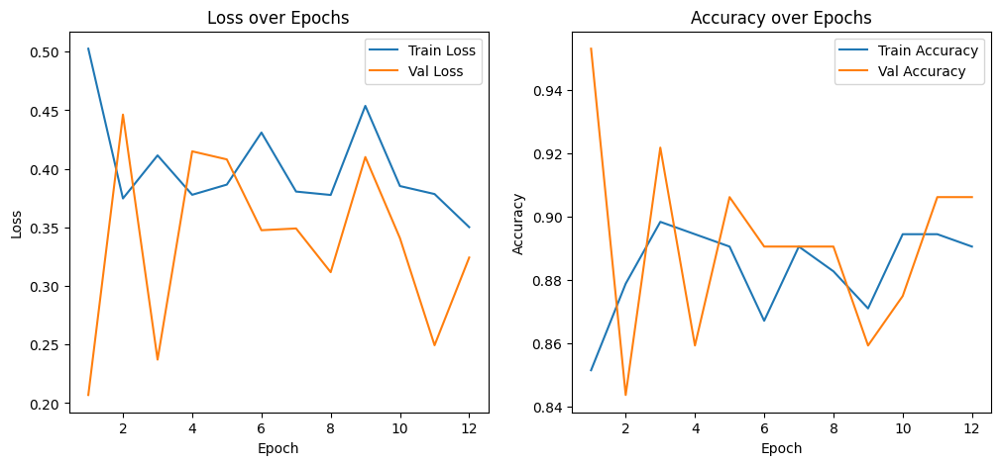

Epoch 13/150
Validation Batch 4/4
Train Loss: 0.3621, Train Accuracy: 0.9062
Validation Loss: 0.4678, Validation Accuracy: 0.7969


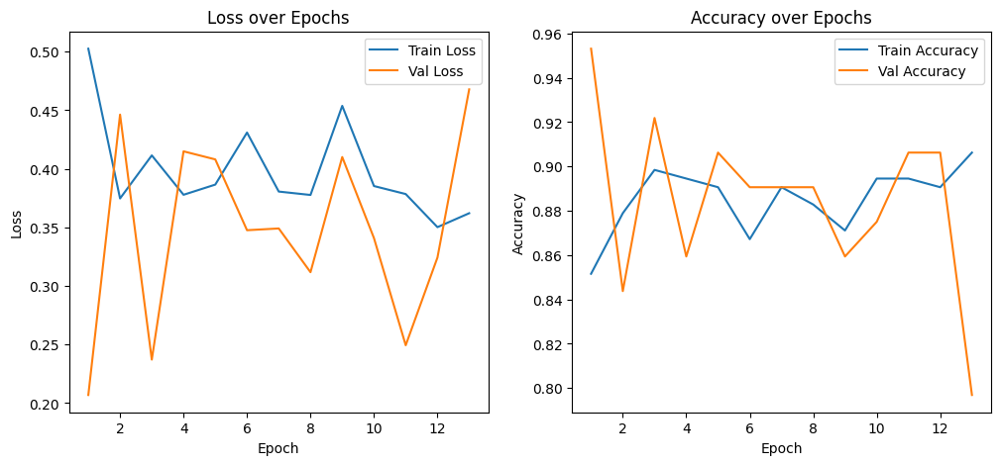

Epoch 14/150
Validation Batch 4/4
Train Loss: 0.3826, Train Accuracy: 0.8906
Validation Loss: 0.2193, Validation Accuracy: 0.9688


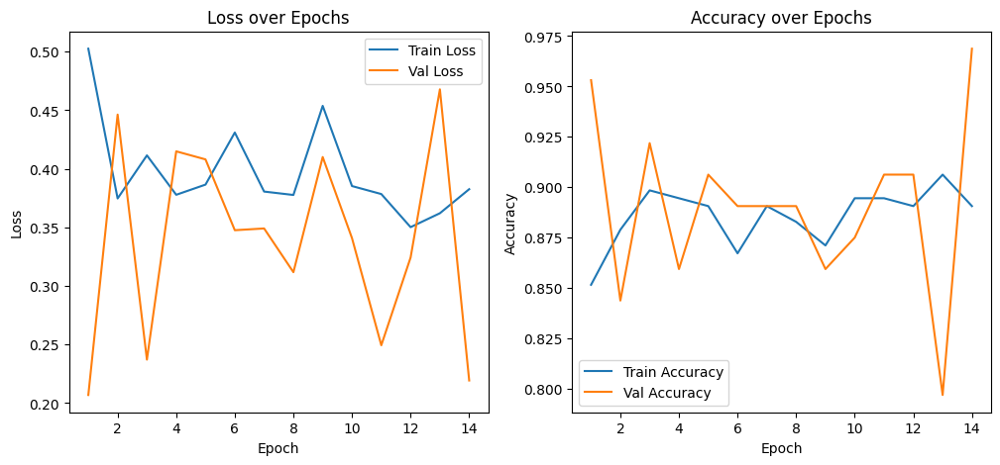

Epoch 15/150
Validation Batch 4/4
Train Loss: 0.4365, Train Accuracy: 0.8750
Validation Loss: 0.3267, Validation Accuracy: 0.9219


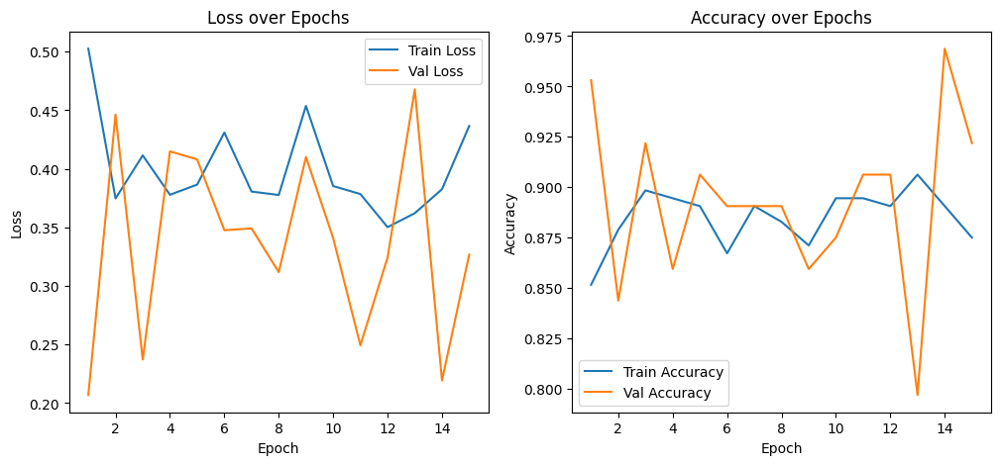

Epoch 16/150
Validation Batch 4/4
Train Loss: 0.3914, Train Accuracy: 0.8789
Validation Loss: 0.3010, Validation Accuracy: 0.9219


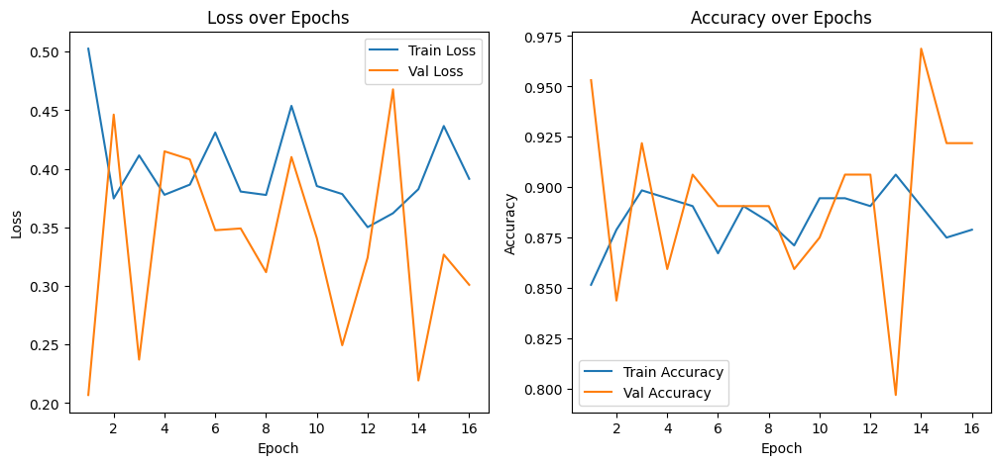

Epoch 17/150
Validation Batch 4/4
Train Loss: 0.3851, Train Accuracy: 0.8828
Validation Loss: 0.2905, Validation Accuracy: 0.9062


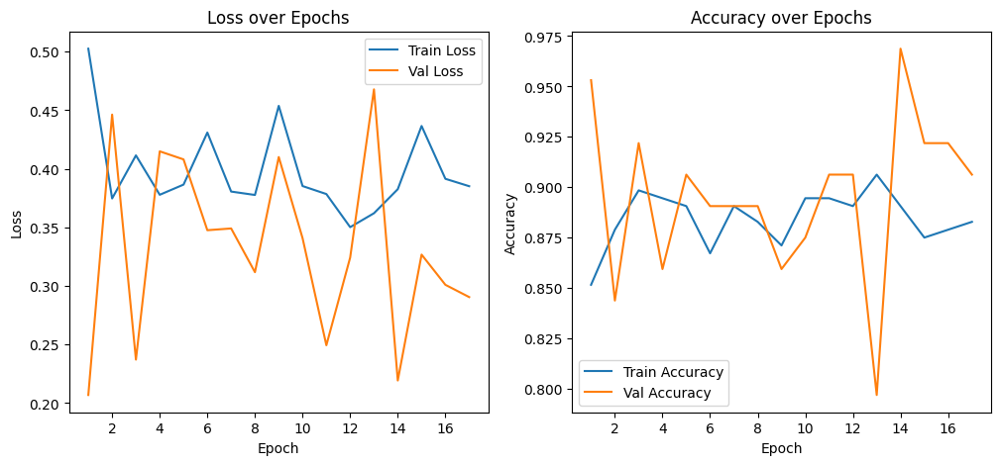

Epoch 18/150
Validation Batch 4/4
Train Loss: 0.3338, Train Accuracy: 0.9023
Validation Loss: 0.2358, Validation Accuracy: 0.9375


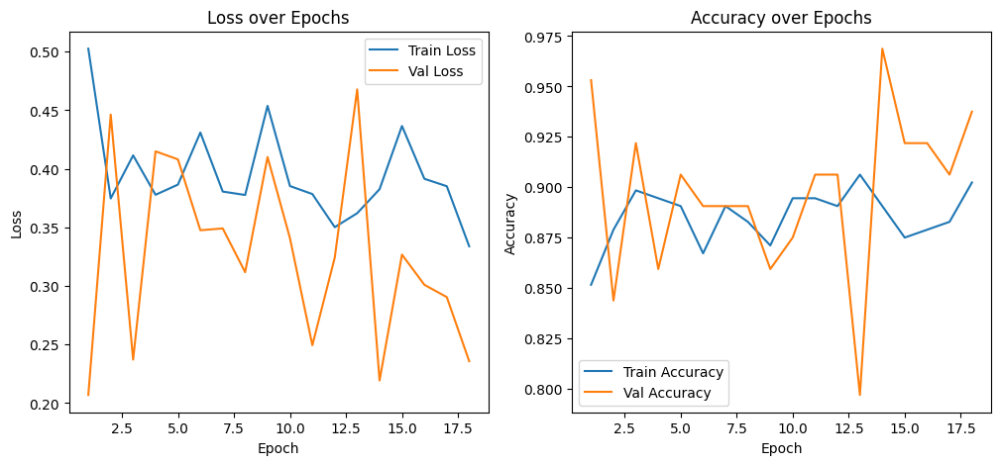

Epoch 19/150
Validation Batch 4/4
Train Loss: 0.4367, Train Accuracy: 0.9023
Validation Loss: 0.3567, Validation Accuracy: 0.8750


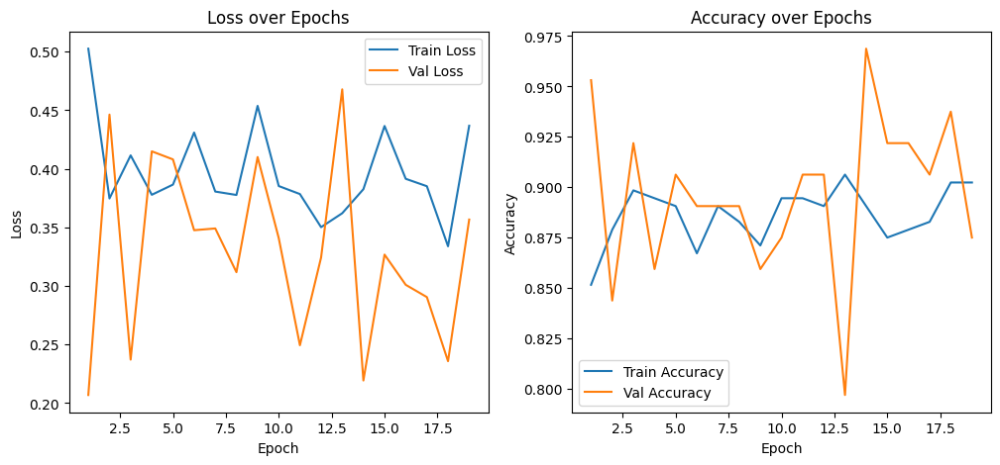

Epoch 20/150
Validation Batch 4/4
Train Loss: 0.3582, Train Accuracy: 0.8867
Validation Loss: 0.2495, Validation Accuracy: 0.9062


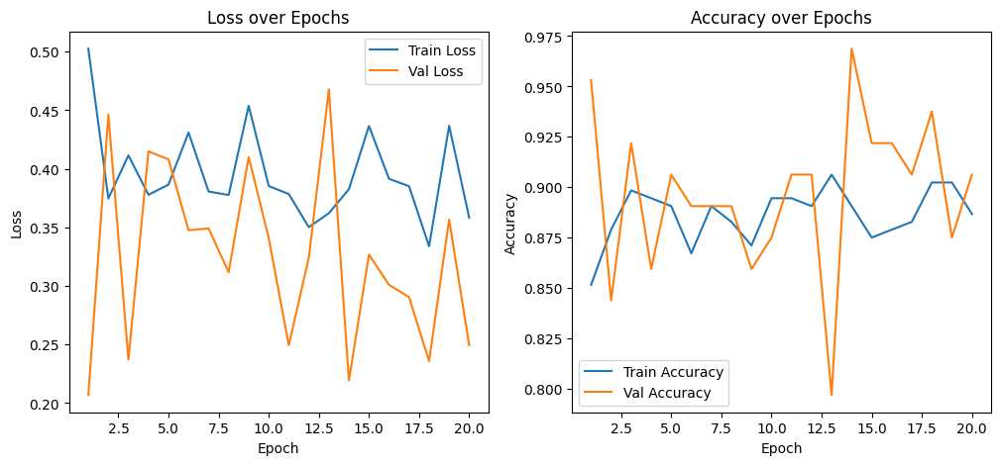

Epoch 21/150
Validation Batch 4/4
Train Loss: 0.4306, Train Accuracy: 0.8906
Validation Loss: 0.3711, Validation Accuracy: 0.8438


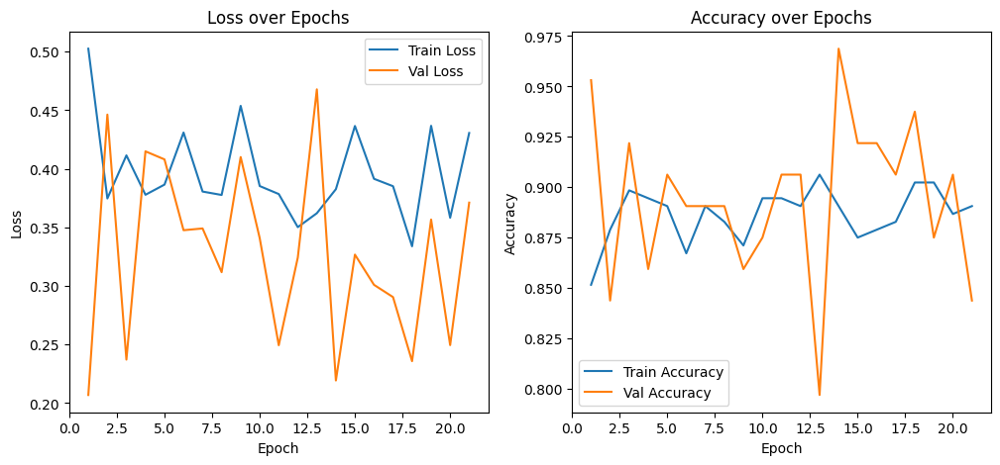

Epoch 22/150
Validation Batch 4/4
Train Loss: 0.3671, Train Accuracy: 0.9023
Validation Loss: 0.2325, Validation Accuracy: 0.9531


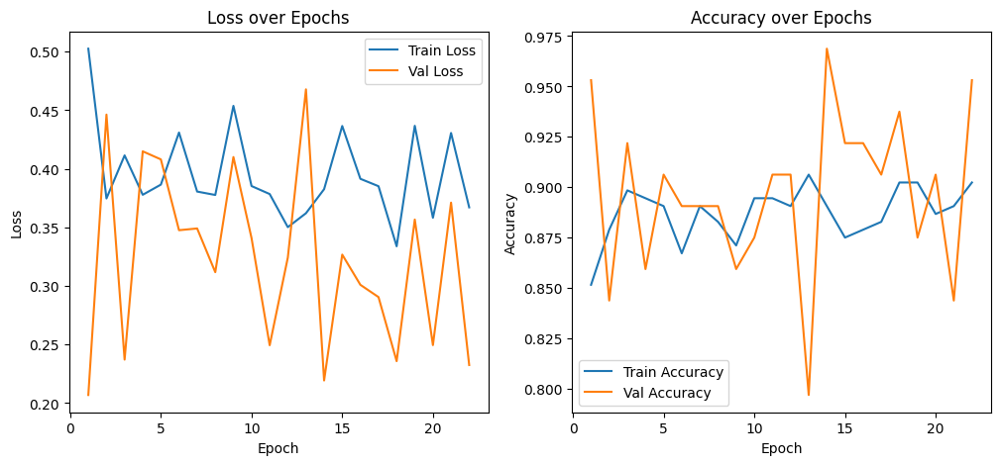

Epoch 23/150
Validation Batch 4/4
Train Loss: 0.3365, Train Accuracy: 0.8984
Validation Loss: 0.4396, Validation Accuracy: 0.8438


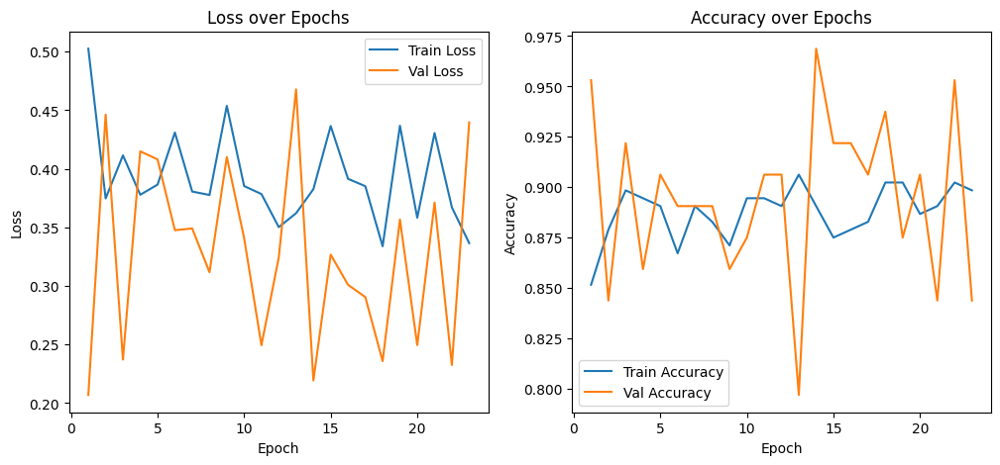

Epoch 24/150
Validation Batch 4/4
Train Loss: 0.3546, Train Accuracy: 0.8867
Validation Loss: 0.3915, Validation Accuracy: 0.8750


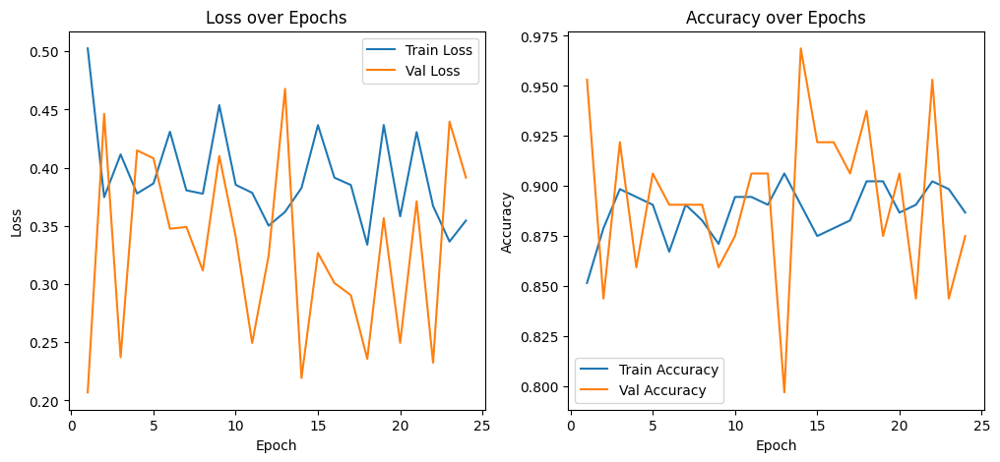

Epoch 25/150
Validation Batch 4/4
Train Loss: 0.3805, Train Accuracy: 0.9023
Validation Loss: 0.4061, Validation Accuracy: 0.8594


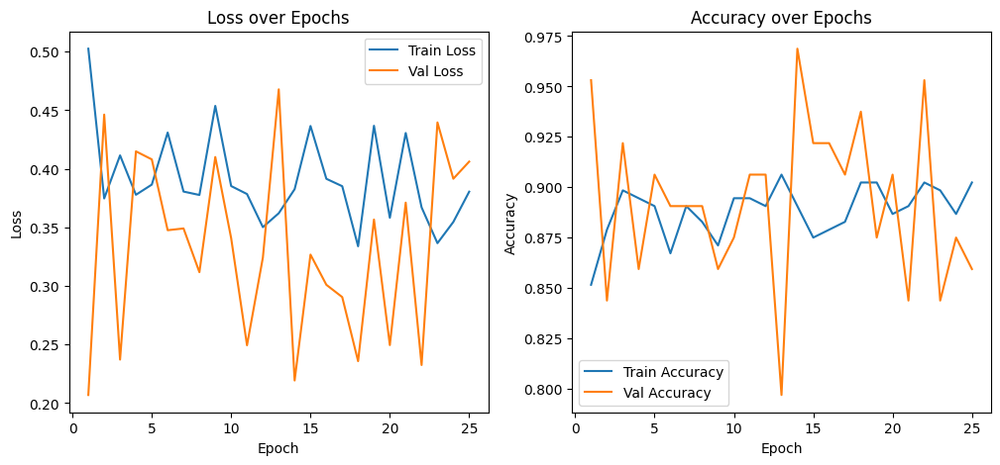

Epoch 26/150
Validation Batch 4/4
Train Loss: 0.3697, Train Accuracy: 0.8906
Validation Loss: 0.3011, Validation Accuracy: 0.9062


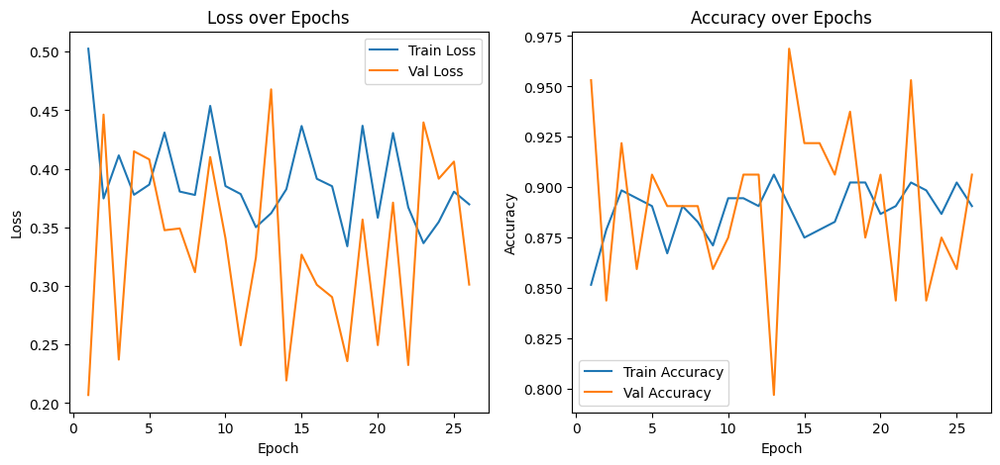

Epoch 27/150
Validation Batch 4/4
Train Loss: 0.3910, Train Accuracy: 0.8867
Validation Loss: 0.3183, Validation Accuracy: 0.8906


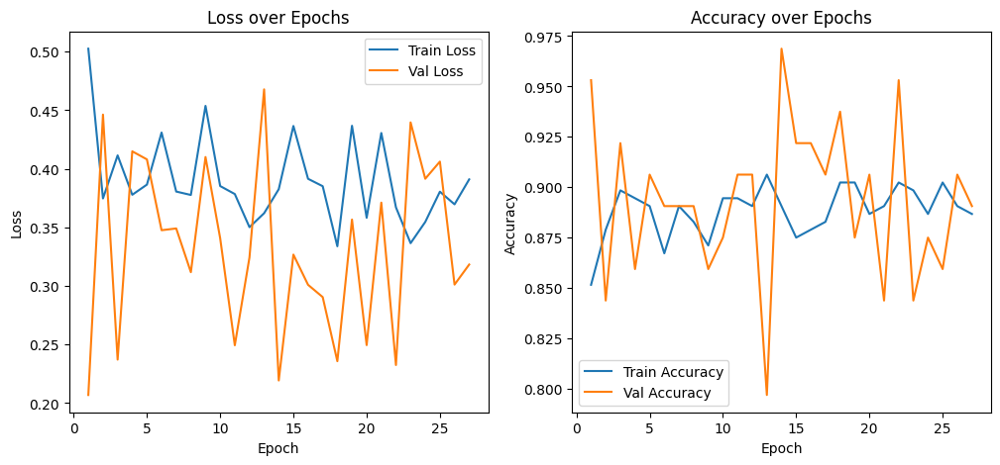

Epoch 28/150
Validation Batch 4/4
Train Loss: 0.3491, Train Accuracy: 0.8867
Validation Loss: 0.3623, Validation Accuracy: 0.8750


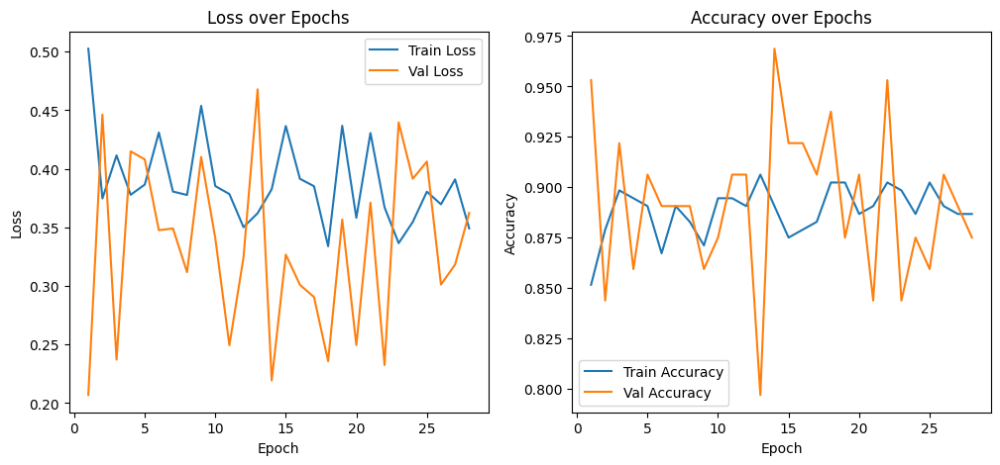

Epoch 29/150
Validation Batch 4/4
Train Loss: 0.3822, Train Accuracy: 0.8828
Validation Loss: 0.4721, Validation Accuracy: 0.8594


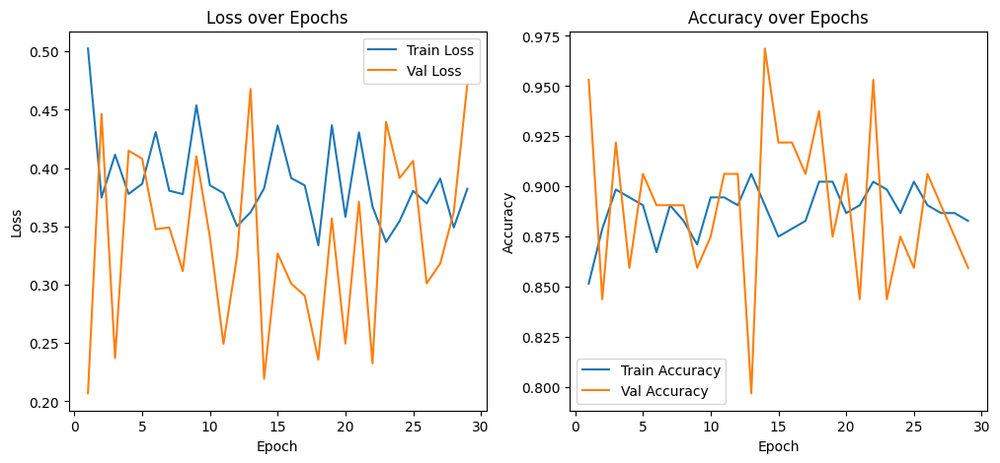

Epoch 30/150
Validation Batch 4/4
Train Loss: 0.3840, Train Accuracy: 0.8750
Validation Loss: 0.3231, Validation Accuracy: 0.9062


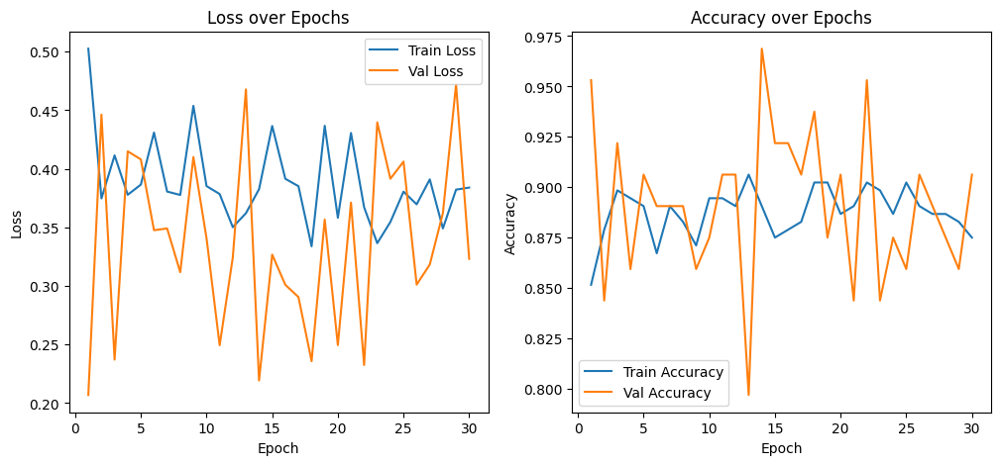

Epoch 31/150
Validation Batch 4/4
Train Loss: 0.3922, Train Accuracy: 0.8906
Validation Loss: 0.3332, Validation Accuracy: 0.8750


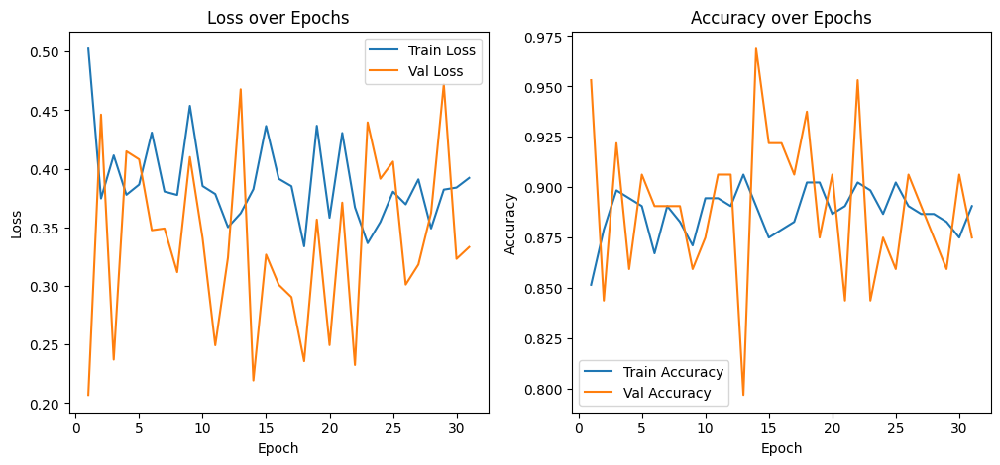

Epoch 32/150
Validation Batch 4/4
Train Loss: 0.3550, Train Accuracy: 0.8984
Validation Loss: 0.4019, Validation Accuracy: 0.8438


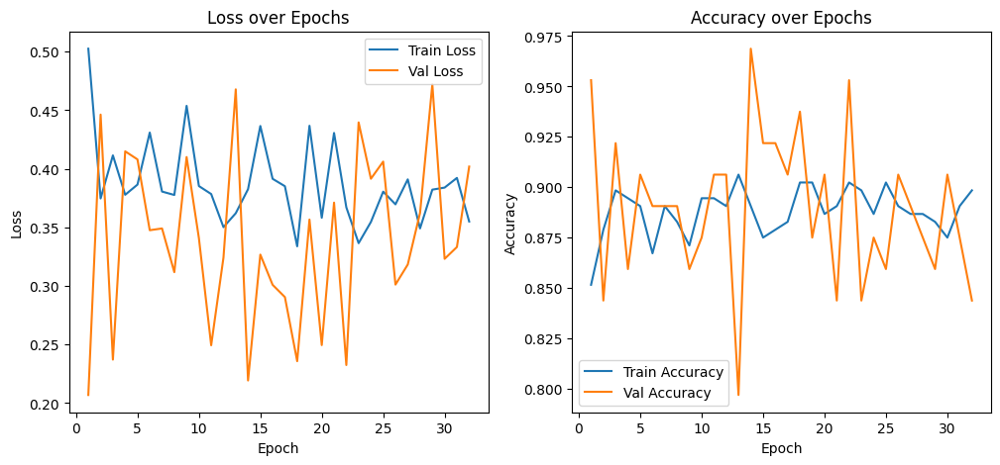

Epoch 33/150
Validation Batch 4/4
Train Loss: 0.3776, Train Accuracy: 0.8711
Validation Loss: 0.3423, Validation Accuracy: 0.8906


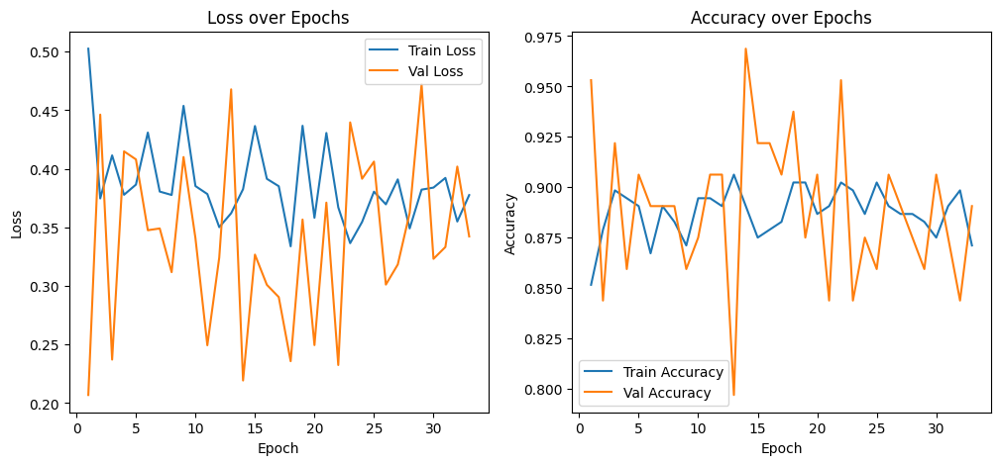

Epoch 34/150
Validation Batch 4/4
Train Loss: 0.3450, Train Accuracy: 0.8906
Validation Loss: 0.2970, Validation Accuracy: 0.9062


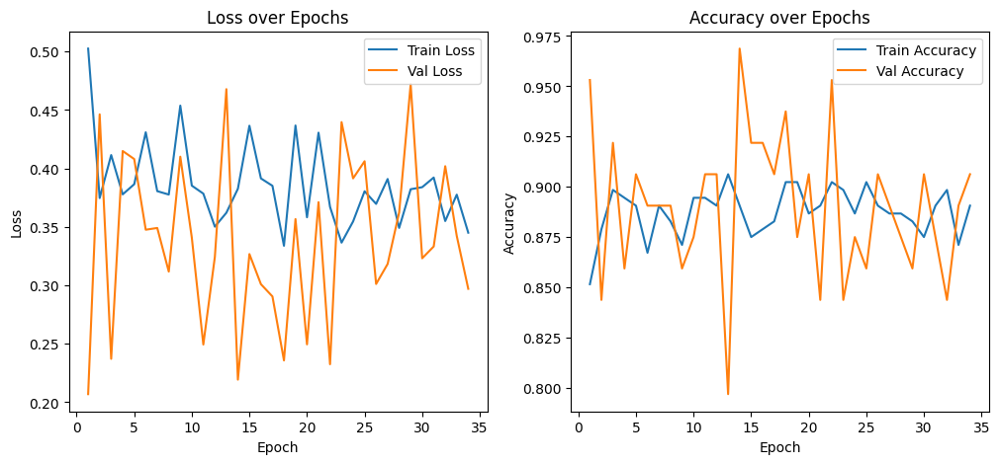

Epoch 35/150
Validation Batch 4/4
Train Loss: 0.3551, Train Accuracy: 0.8789
Validation Loss: 0.3934, Validation Accuracy: 0.8750


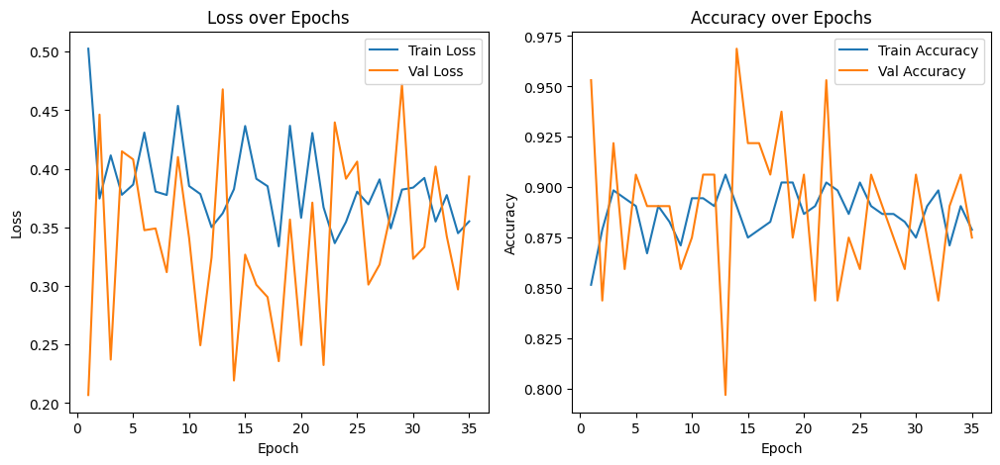

Epoch 36/150
Validation Batch 4/4
Train Loss: 0.3521, Train Accuracy: 0.8867
Validation Loss: 0.3117, Validation Accuracy: 0.8906


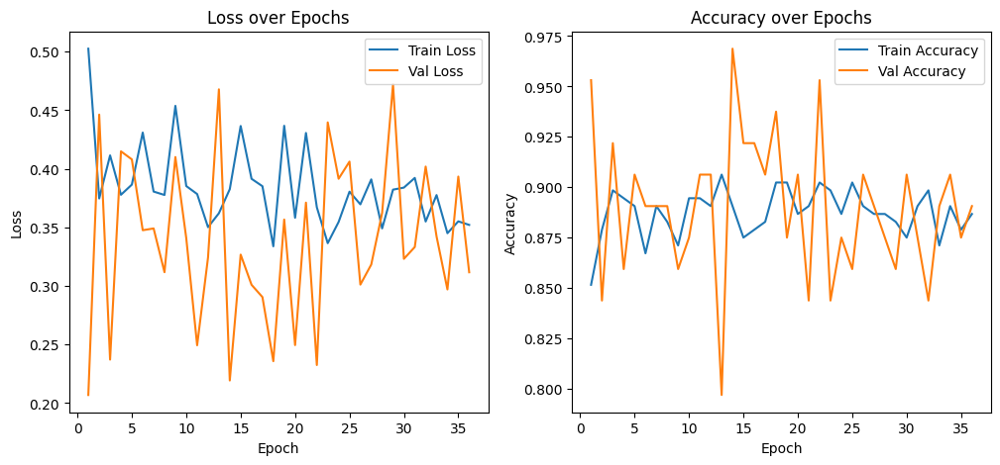

Epoch 37/150
Validation Batch 4/4
Train Loss: 0.3643, Train Accuracy: 0.9023
Validation Loss: 0.3858, Validation Accuracy: 0.8906


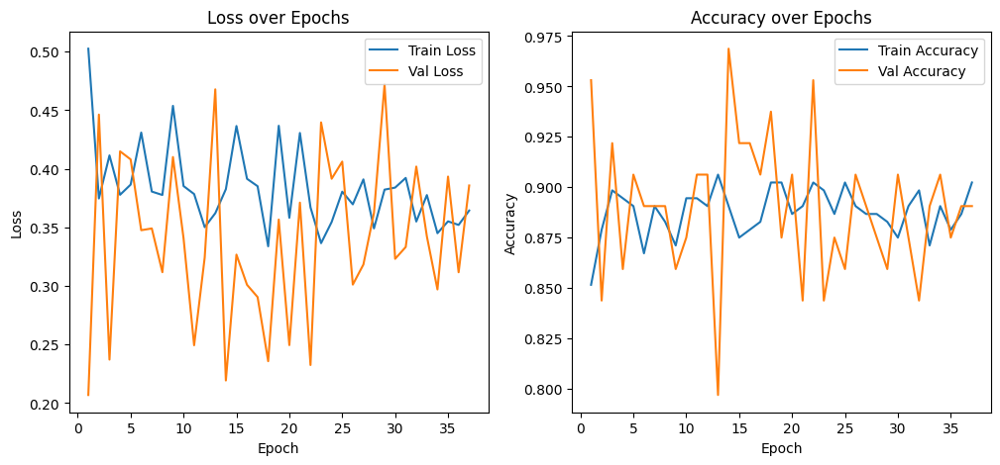

Epoch 38/150
Validation Batch 4/4
Train Loss: 0.3912, Train Accuracy: 0.8789
Validation Loss: 0.2595, Validation Accuracy: 0.9062


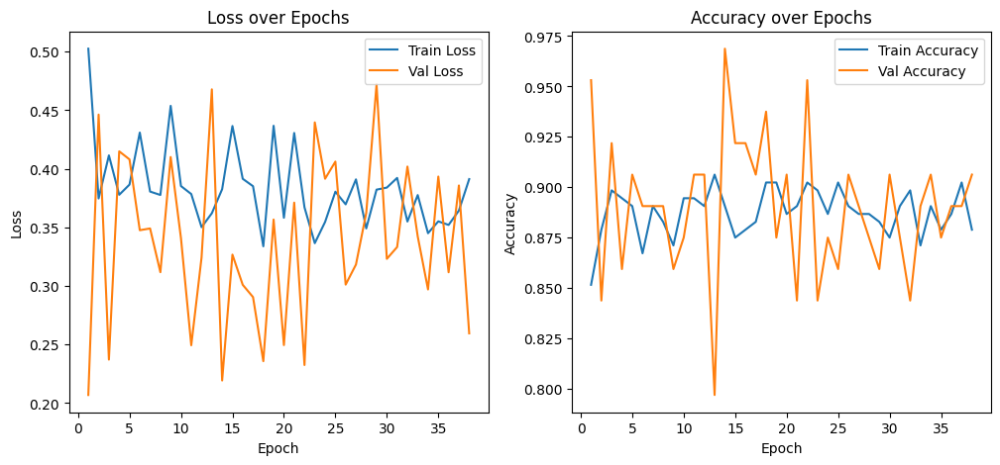

Epoch 39/150
Validation Batch 4/4
Train Loss: 0.3427, Train Accuracy: 0.8906
Validation Loss: 0.3636, Validation Accuracy: 0.8750


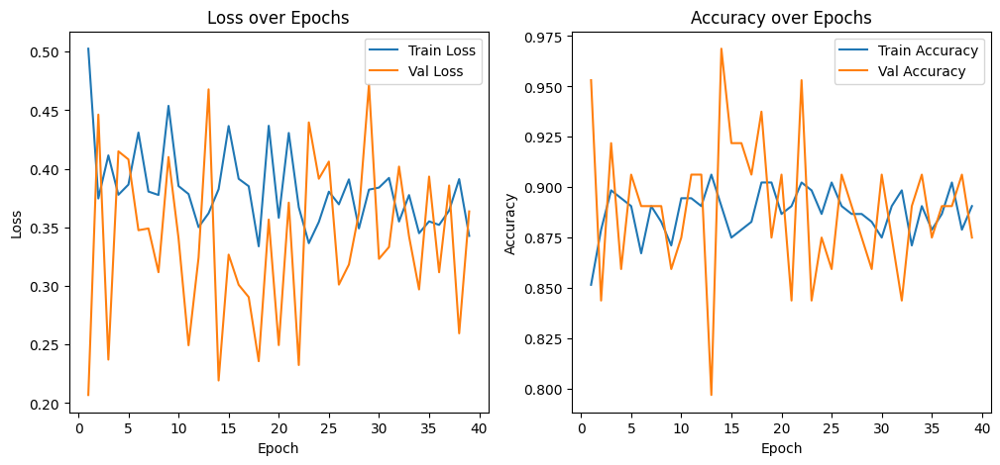

Epoch 40/150
Validation Batch 4/4
Train Loss: 0.3795, Train Accuracy: 0.8945
Validation Loss: 0.2522, Validation Accuracy: 0.9375


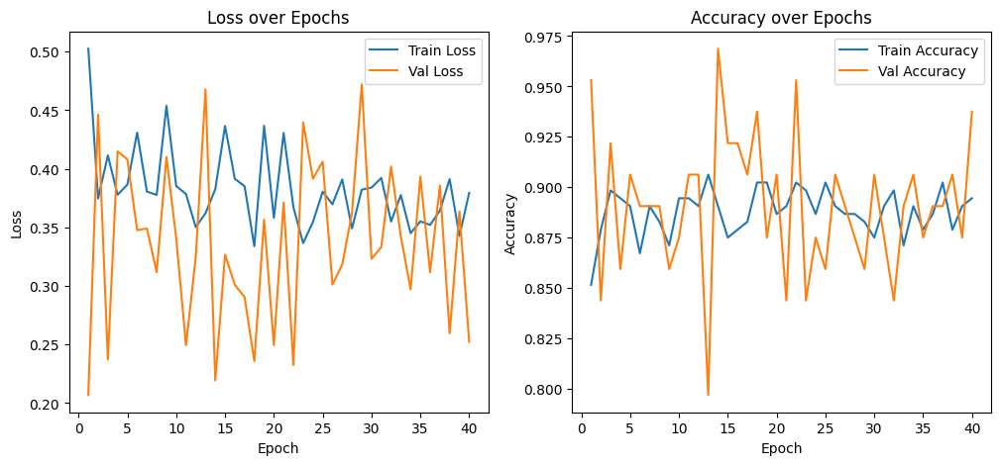

Epoch 41/150
Validation Batch 4/4
Train Loss: 0.3274, Train Accuracy: 0.9062
Validation Loss: 0.3908, Validation Accuracy: 0.8594


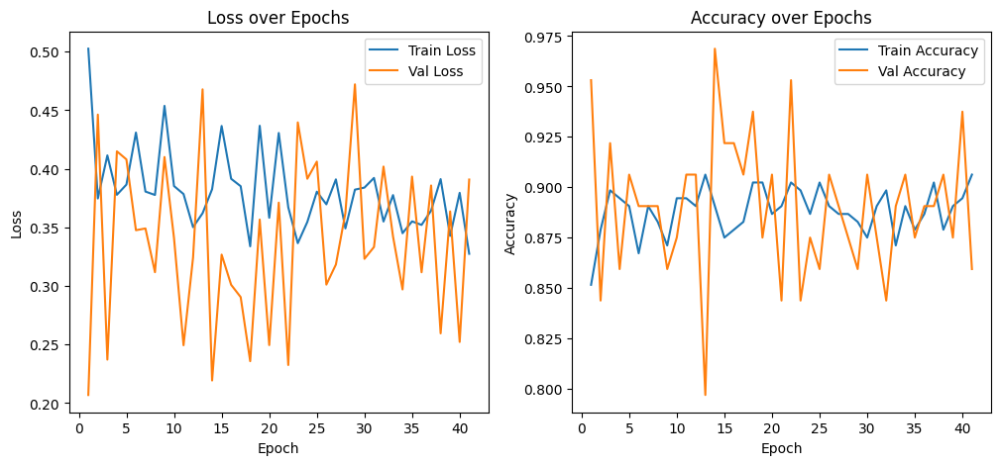

Epoch 42/150
Validation Batch 4/4
Train Loss: 0.3557, Train Accuracy: 0.8828
Validation Loss: 0.4680, Validation Accuracy: 0.7969


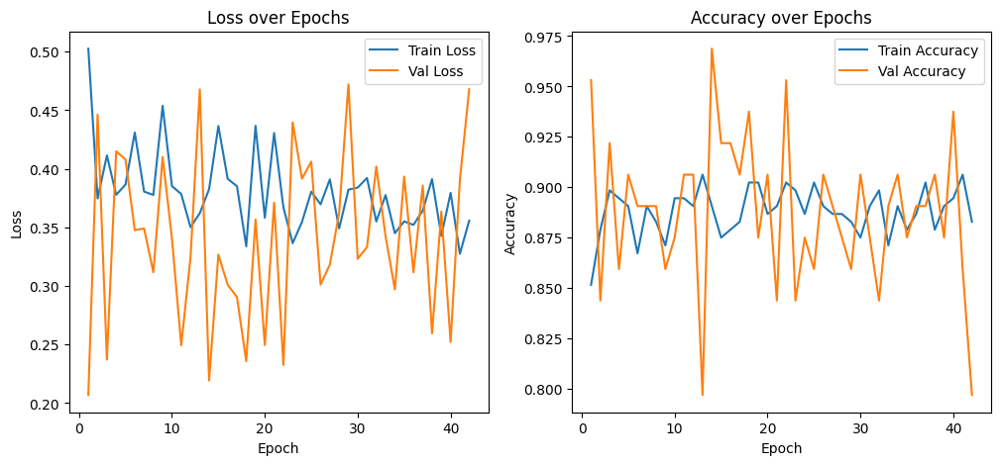

Epoch 43/150
Validation Batch 4/4
Train Loss: 0.3657, Train Accuracy: 0.8750
Validation Loss: 0.4476, Validation Accuracy: 0.8281


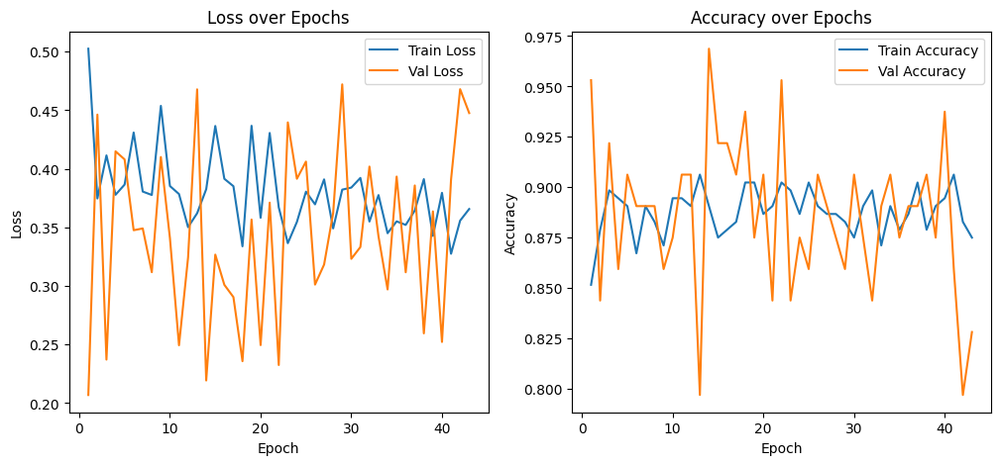

Epoch 44/150
Validation Batch 4/4
Train Loss: 0.4306, Train Accuracy: 0.8984
Validation Loss: 0.2084, Validation Accuracy: 0.9531


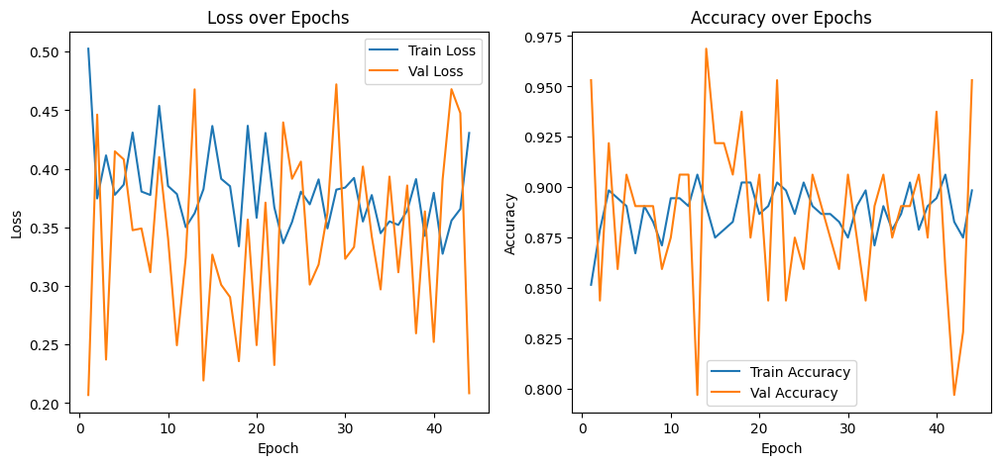

Epoch 45/150
Validation Batch 4/4
Train Loss: 0.3528, Train Accuracy: 0.9062
Validation Loss: 0.3063, Validation Accuracy: 0.9062


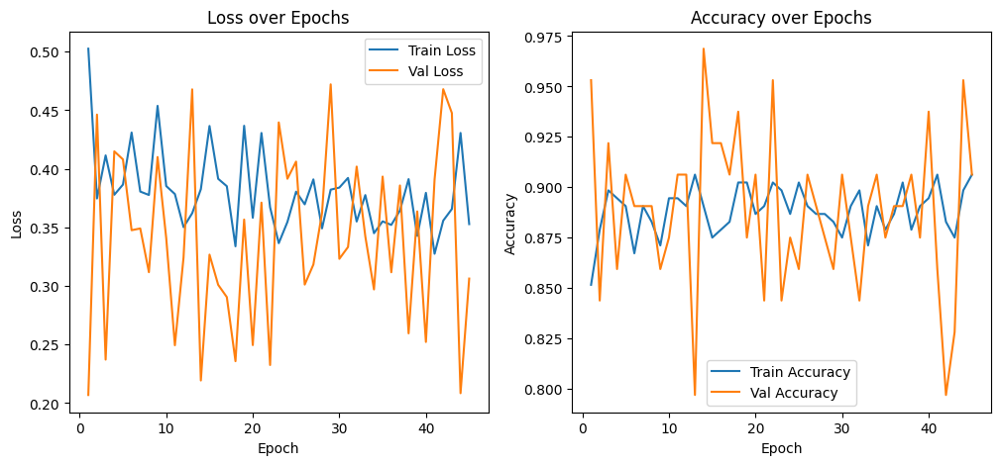

Epoch 46/150
Validation Batch 4/4
Train Loss: 0.3536, Train Accuracy: 0.9023
Validation Loss: 0.3301, Validation Accuracy: 0.9062


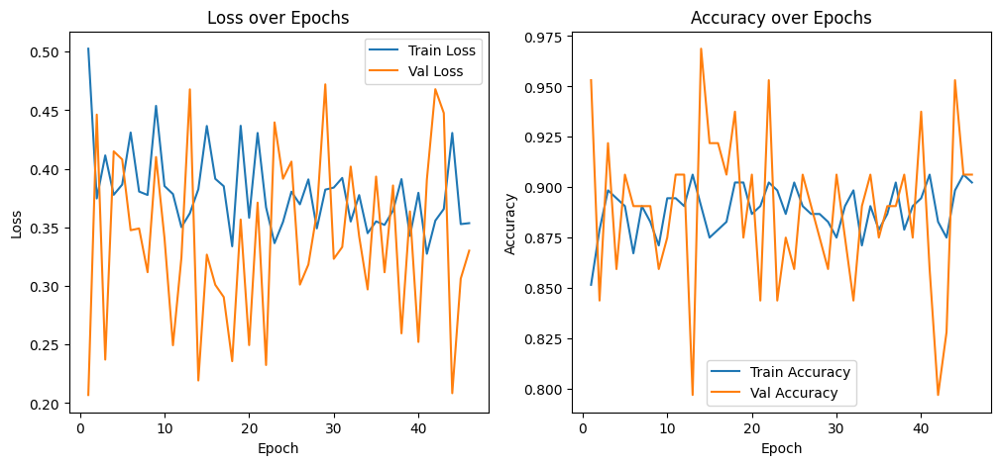

Epoch 47/150
Validation Batch 4/4
Train Loss: 0.3408, Train Accuracy: 0.8984
Validation Loss: 0.4135, Validation Accuracy: 0.8438


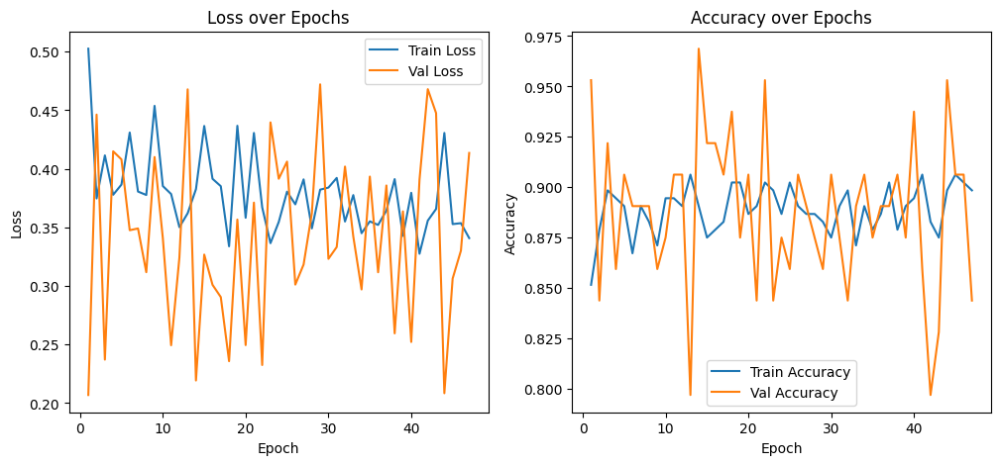

Epoch 48/150
Validation Batch 4/4
Train Loss: 0.4421, Train Accuracy: 0.8828
Validation Loss: 0.3195, Validation Accuracy: 0.9219


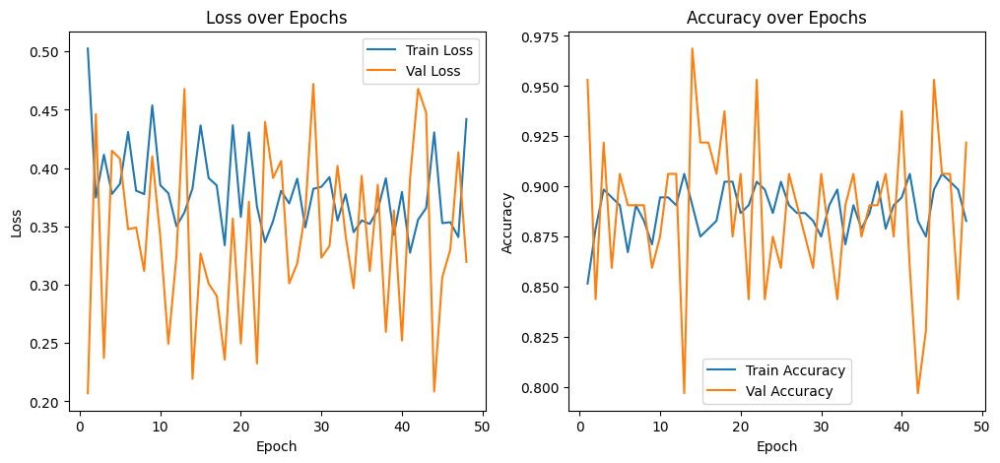

Epoch 49/150
Validation Batch 4/4
Train Loss: 0.3471, Train Accuracy: 0.9023
Validation Loss: 0.3535, Validation Accuracy: 0.8906


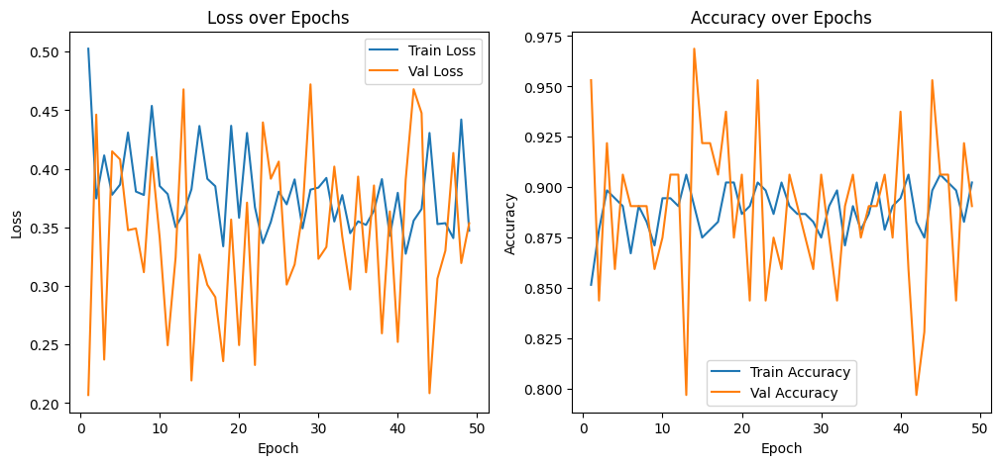

Epoch 50/150
Validation Batch 4/4
Train Loss: 0.4136, Train Accuracy: 0.8828
Validation Loss: 0.3805, Validation Accuracy: 0.8750


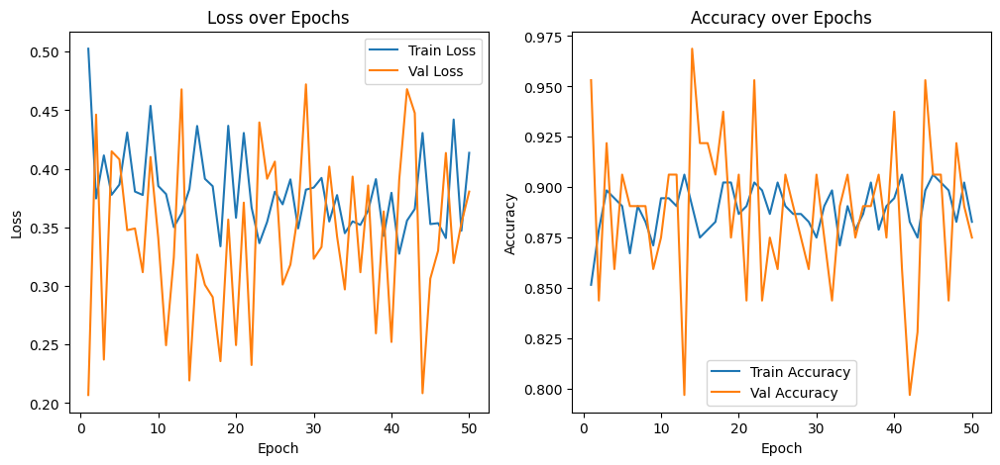

Epoch 51/150
Validation Batch 4/4
Train Loss: 0.3961, Train Accuracy: 0.8750
Validation Loss: 0.4170, Validation Accuracy: 0.8594


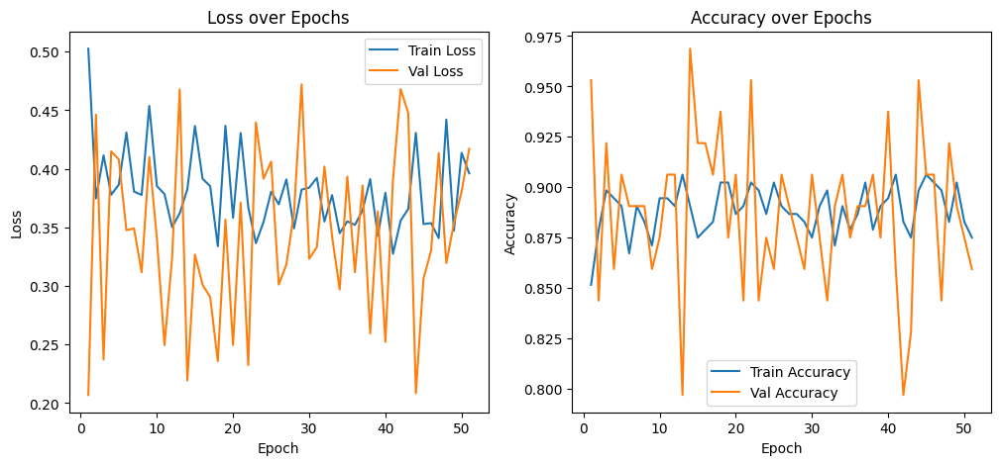

Epoch 52/150
Validation Batch 4/4
Train Loss: 0.3580, Train Accuracy: 0.9062
Validation Loss: 0.3461, Validation Accuracy: 0.8750


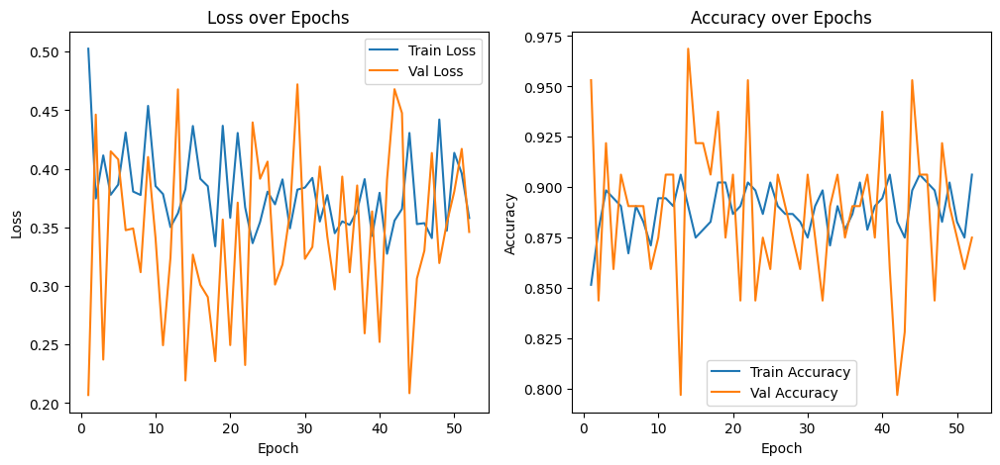

Epoch 53/150
Validation Batch 4/4
Train Loss: 0.3201, Train Accuracy: 0.9023
Validation Loss: 0.3111, Validation Accuracy: 0.8906


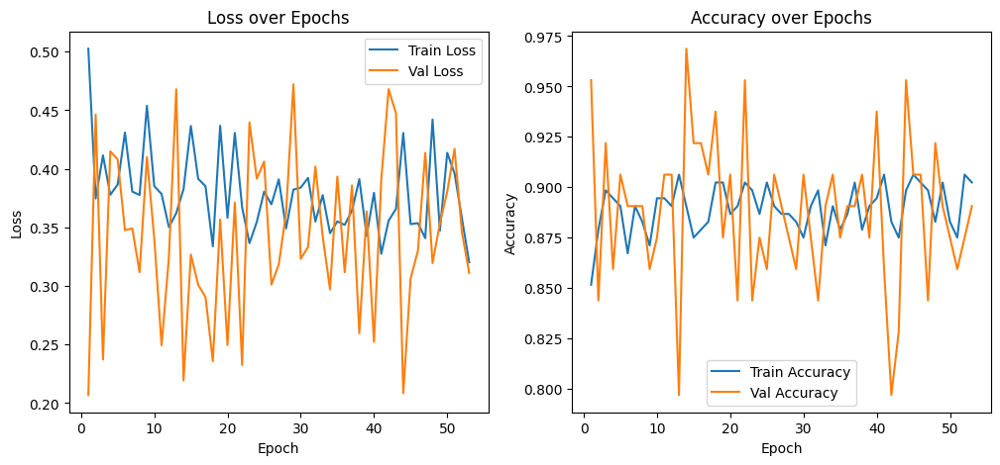

Epoch 54/150
Validation Batch 4/4
Train Loss: 0.3582, Train Accuracy: 0.8906
Validation Loss: 0.2791, Validation Accuracy: 0.9531


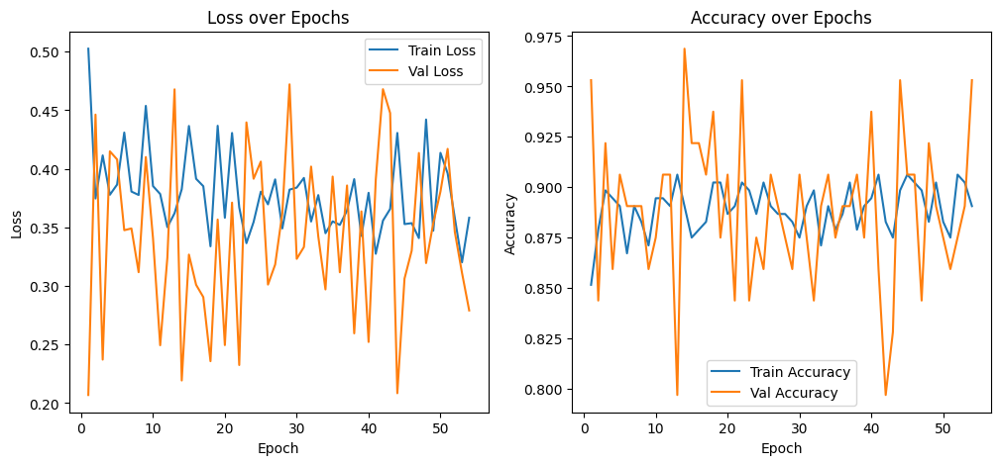

Epoch 55/150
Validation Batch 4/4
Train Loss: 0.3759, Train Accuracy: 0.8828
Validation Loss: 0.2605, Validation Accuracy: 0.9062


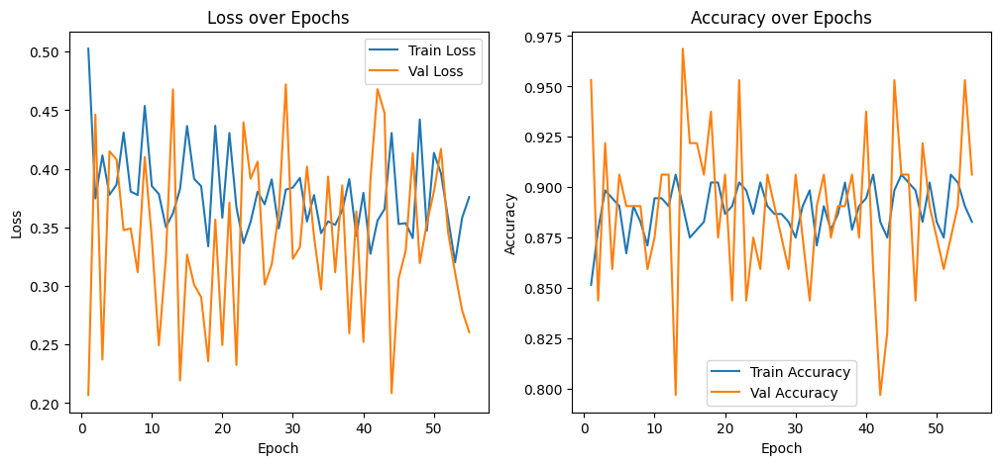

Epoch 56/150
Validation Batch 4/4
Train Loss: 0.3295, Train Accuracy: 0.8945
Validation Loss: 0.3898, Validation Accuracy: 0.8594


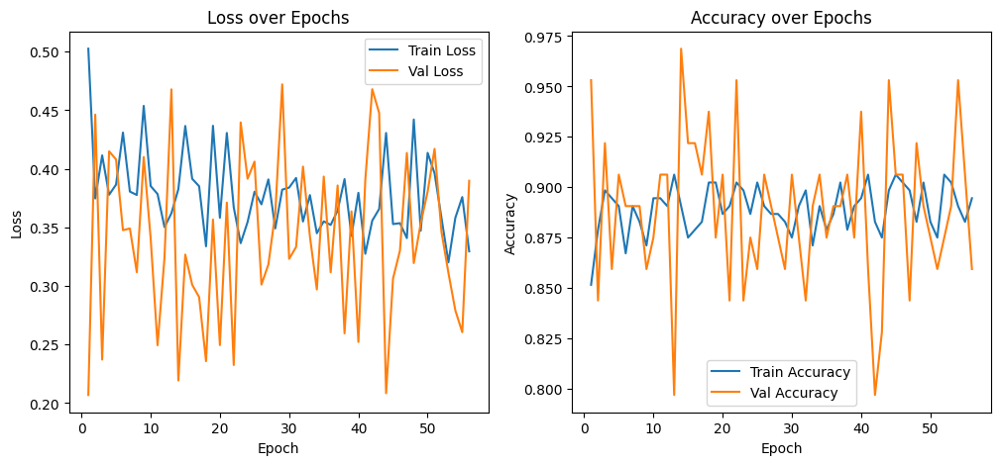

Epoch 57/150
Validation Batch 4/4
Train Loss: 0.3205, Train Accuracy: 0.9102
Validation Loss: 0.2633, Validation Accuracy: 0.9219


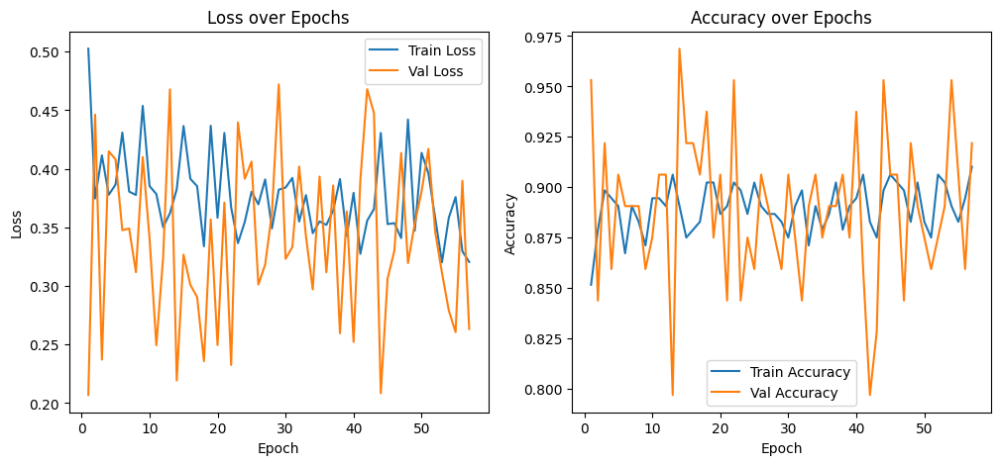

Epoch 58/150
Validation Batch 4/4
Train Loss: 0.6617, Train Accuracy: 0.8750
Validation Loss: 0.3941, Validation Accuracy: 0.8750


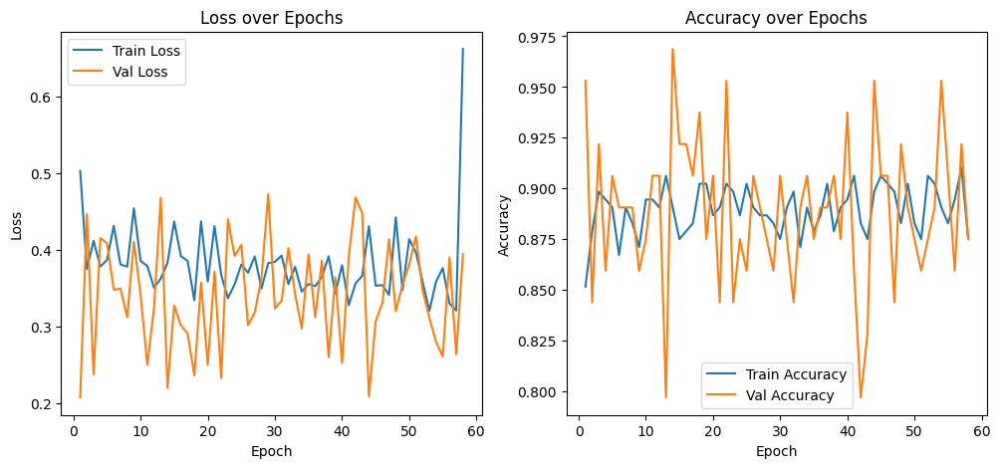

Epoch 59/150
Validation Batch 4/4
Train Loss: 0.4067, Train Accuracy: 0.8867
Validation Loss: 0.3827, Validation Accuracy: 0.8906


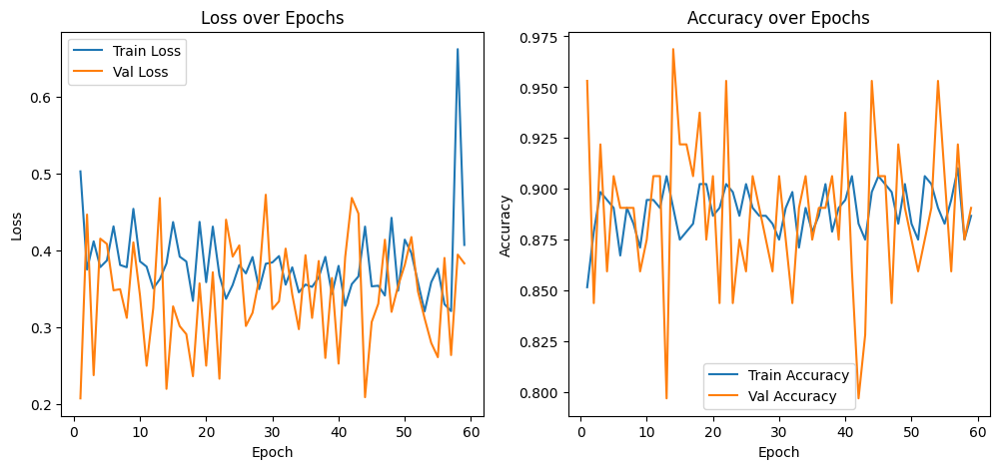

Epoch 60/150
Validation Batch 4/4
Train Loss: 0.4666, Train Accuracy: 0.8711
Validation Loss: 0.4694, Validation Accuracy: 0.8750


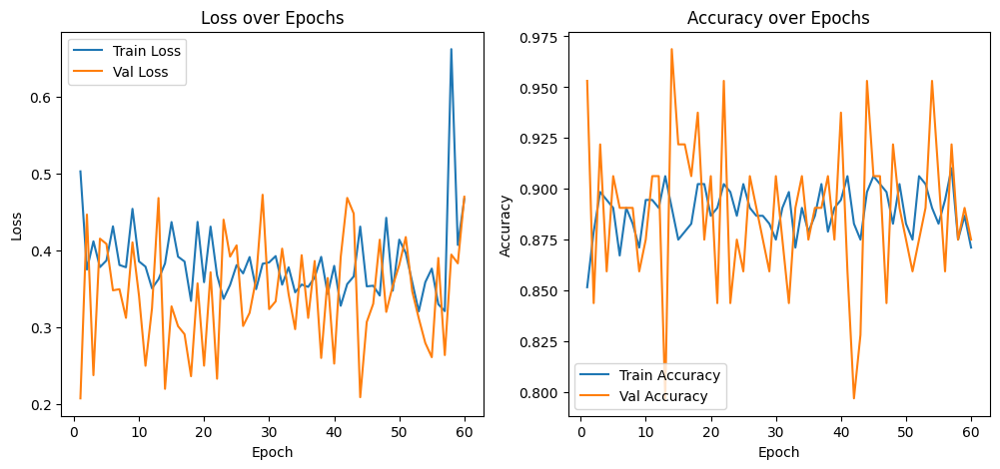

Epoch 61/150
Validation Batch 4/4
Train Loss: 0.3765, Train Accuracy: 0.8867
Validation Loss: 0.4736, Validation Accuracy: 0.8281


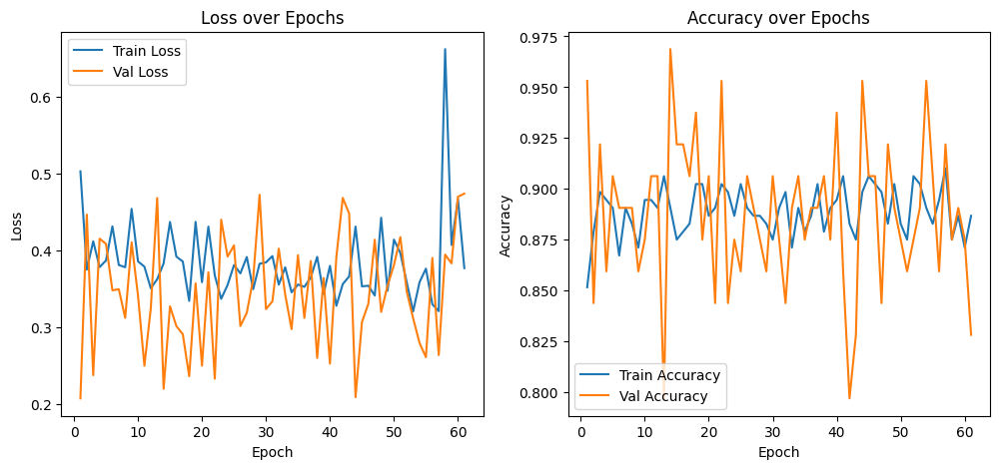

Epoch 62/150
Validation Batch 4/4
Train Loss: 0.3420, Train Accuracy: 0.8945
Validation Loss: 0.1968, Validation Accuracy: 0.9375


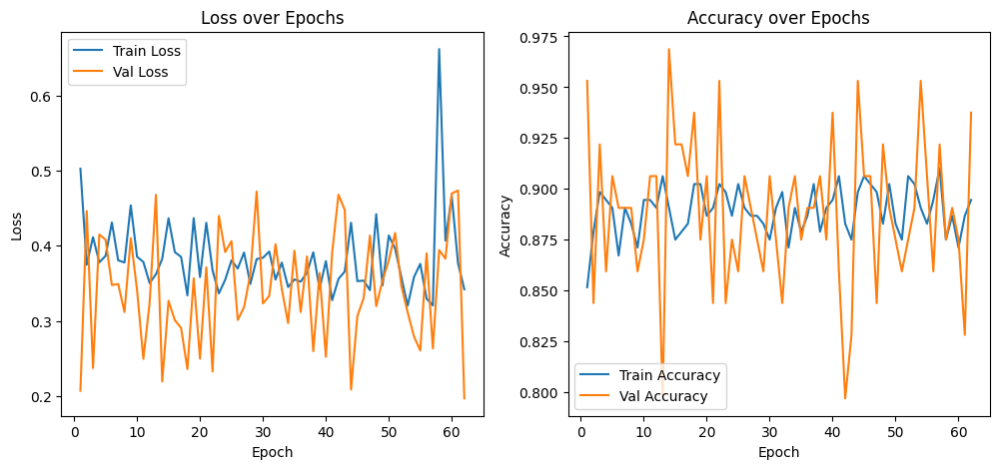

New best model saved to /content/drive/MyDrive/Projects/CNC/CNC_mill/models/best_model_epoch_62.keras
Epoch 63/150
Validation Batch 4/4
Train Loss: 0.3598, Train Accuracy: 0.8945
Validation Loss: 0.3943, Validation Accuracy: 0.9062


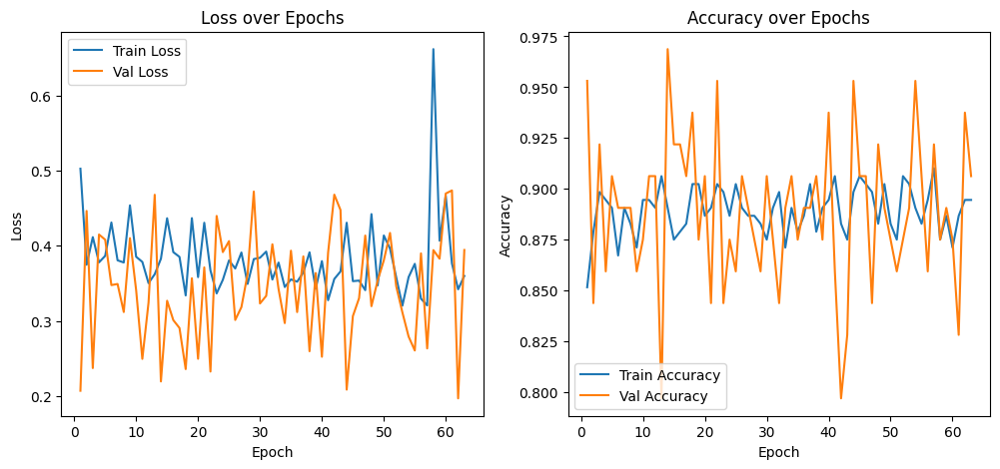

Epoch 64/150
Validation Batch 4/4
Train Loss: 0.3271, Train Accuracy: 0.8984
Validation Loss: 0.1980, Validation Accuracy: 0.9531


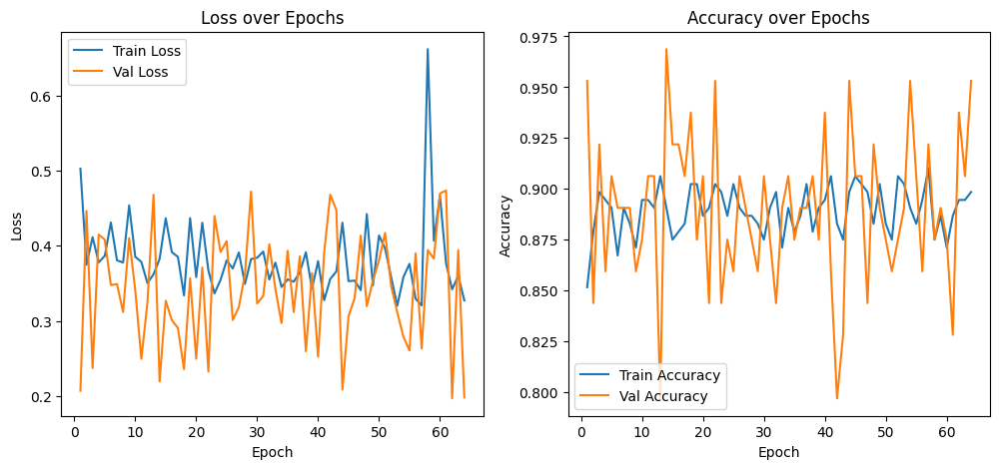

Epoch 65/150
Validation Batch 4/4
Train Loss: 0.3516, Train Accuracy: 0.9062
Validation Loss: 0.4441, Validation Accuracy: 0.8281


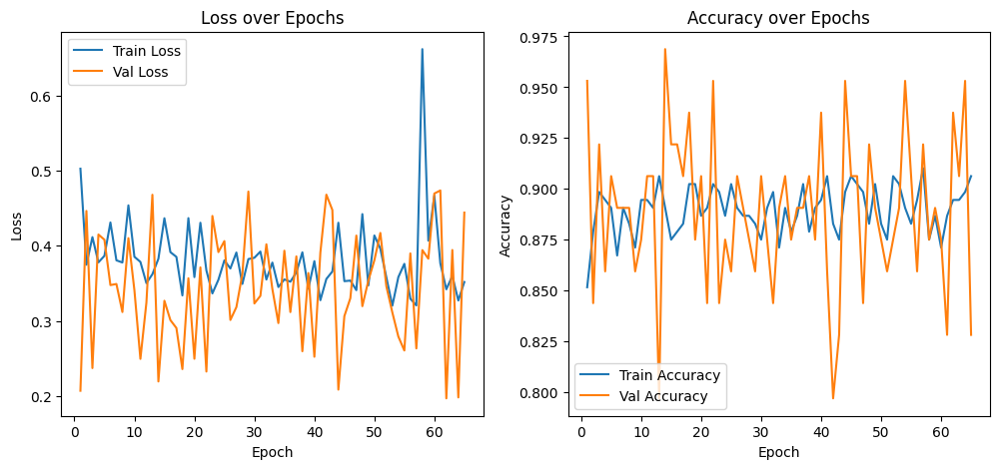

Epoch 66/150
Validation Batch 4/4
Train Loss: 0.3813, Train Accuracy: 0.8789
Validation Loss: 0.2532, Validation Accuracy: 0.9375


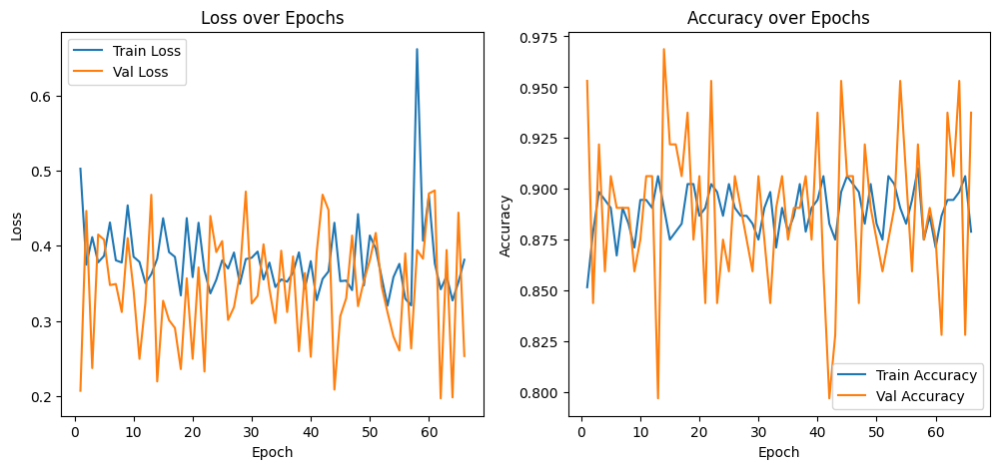

Epoch 67/150
Validation Batch 4/4
Train Loss: 0.4067, Train Accuracy: 0.8828
Validation Loss: 0.2815, Validation Accuracy: 0.9219


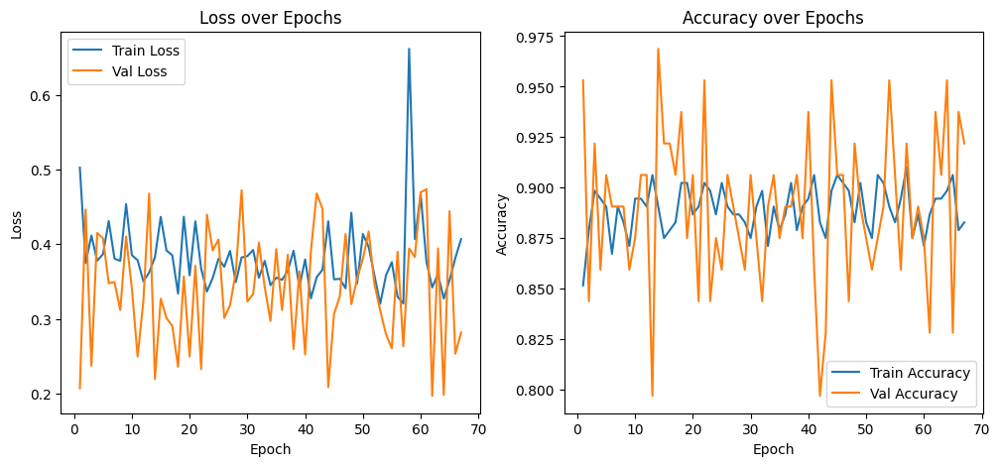

Epoch 68/150
Validation Batch 4/4
Train Loss: 0.4134, Train Accuracy: 0.8828
Validation Loss: 0.4667, Validation Accuracy: 0.8125


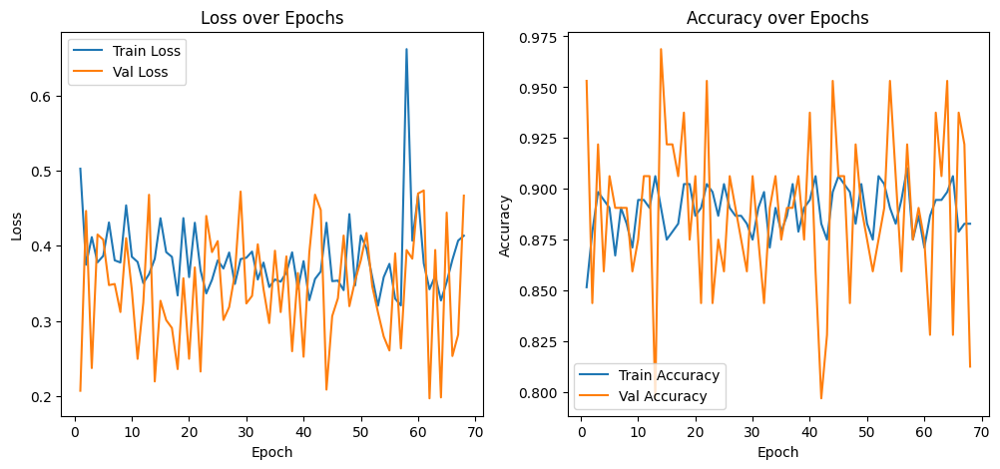

Epoch 69/150
Validation Batch 4/4
Train Loss: 0.4019, Train Accuracy: 0.8906
Validation Loss: 0.3582, Validation Accuracy: 0.8906


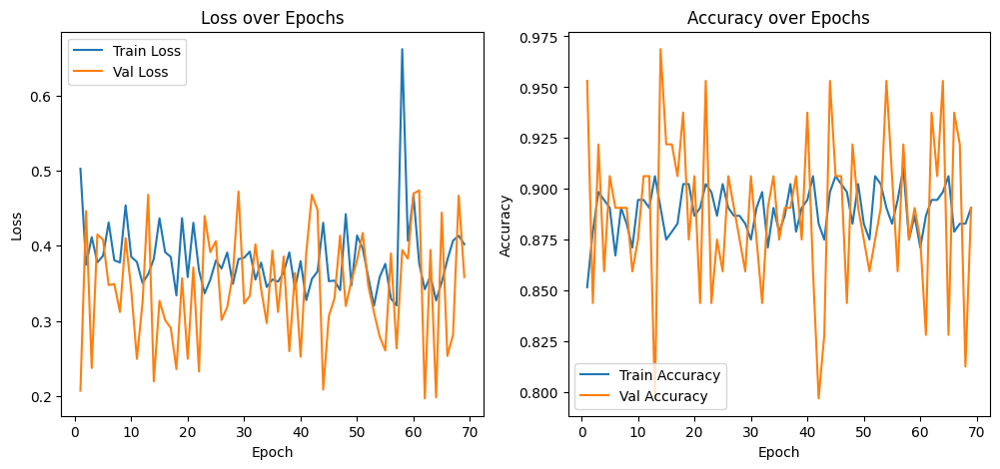

Epoch 70/150
Validation Batch 4/4
Train Loss: 0.3165, Train Accuracy: 0.9062
Validation Loss: 0.2955, Validation Accuracy: 0.9062


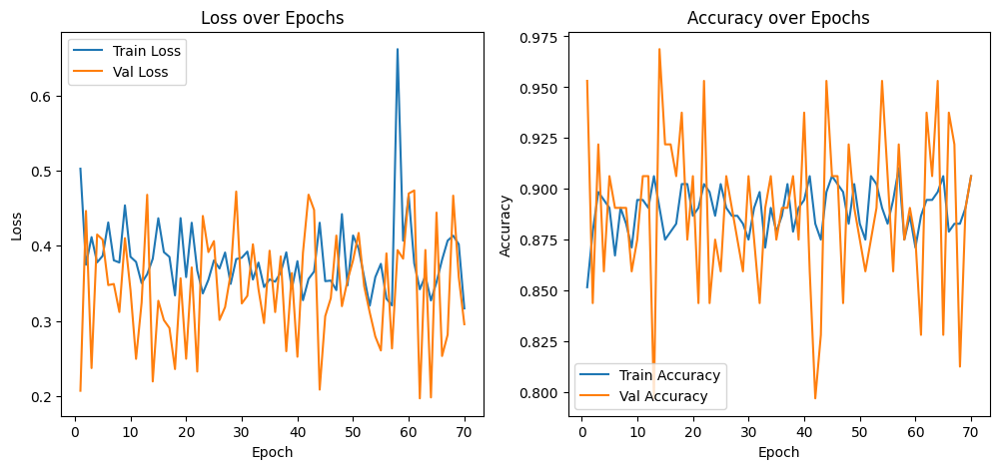

Epoch 71/150
Validation Batch 4/4
Train Loss: 0.3895, Train Accuracy: 0.9023
Validation Loss: 0.1947, Validation Accuracy: 0.9531


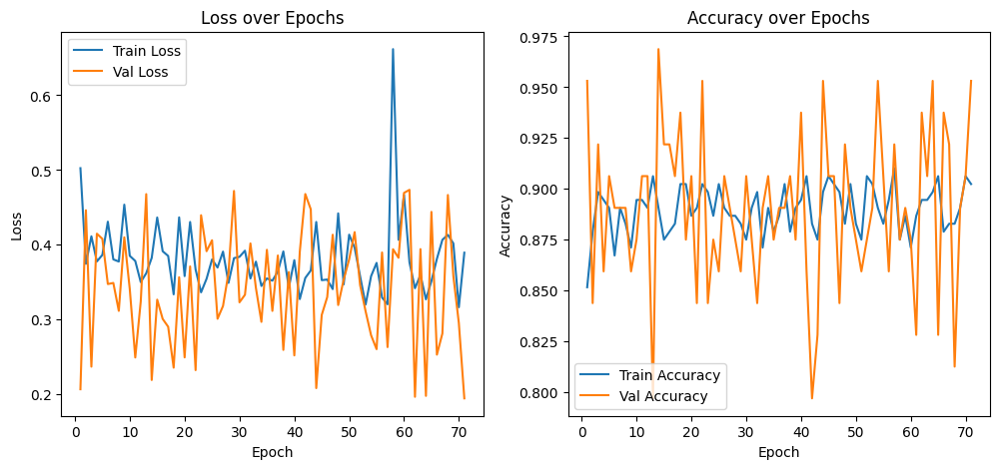

New best model saved to /content/drive/MyDrive/Projects/CNC/CNC_mill/models/best_model_epoch_71.keras
Epoch 72/150
Validation Batch 4/4
Train Loss: 0.3799, Train Accuracy: 0.8867
Validation Loss: 0.2732, Validation Accuracy: 0.9219


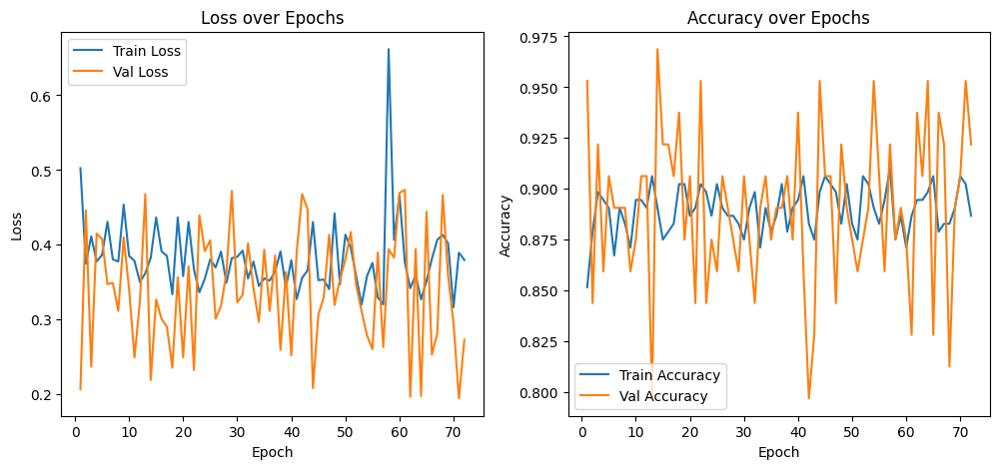

Epoch 73/150
Validation Batch 4/4
Train Loss: 0.3558, Train Accuracy: 0.8945
Validation Loss: 0.2425, Validation Accuracy: 0.9219


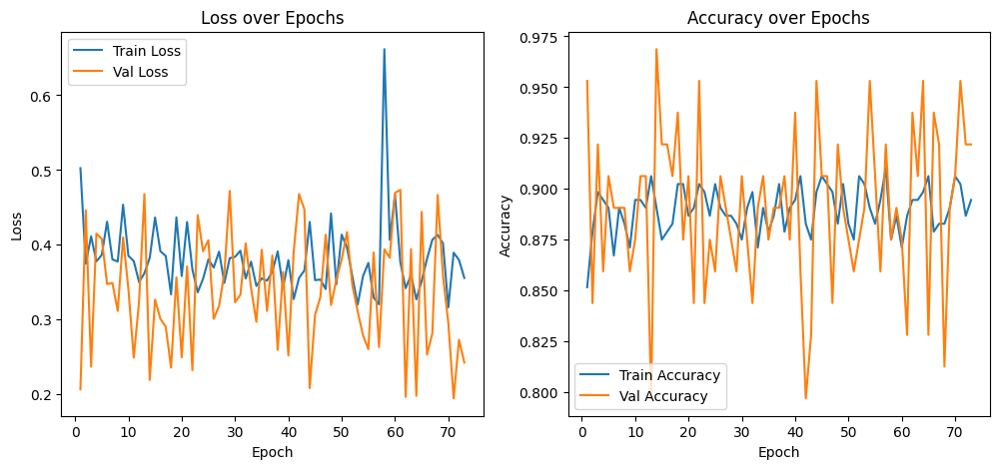

Epoch 74/150
Validation Batch 4/4
Train Loss: 0.3537, Train Accuracy: 0.8906
Validation Loss: 0.3346, Validation Accuracy: 0.8750


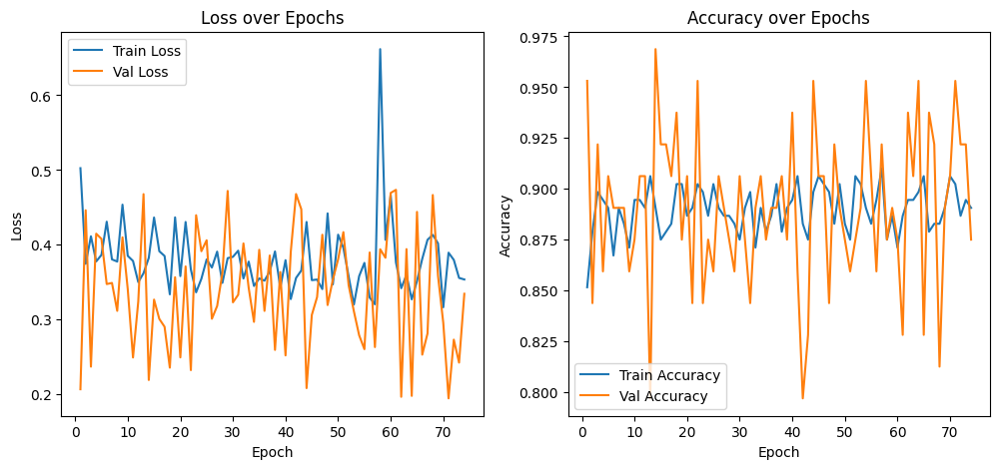

Epoch 75/150
Validation Batch 4/4
Train Loss: 0.3843, Train Accuracy: 0.9023
Validation Loss: 0.4147, Validation Accuracy: 0.8281


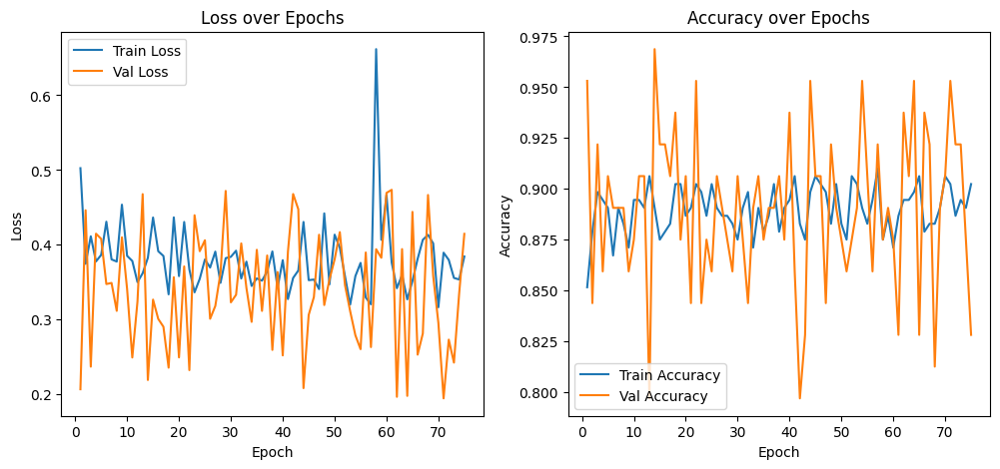

Epoch 76/150
Validation Batch 4/4
Train Loss: 0.3955, Train Accuracy: 0.8750
Validation Loss: 0.3545, Validation Accuracy: 0.8750


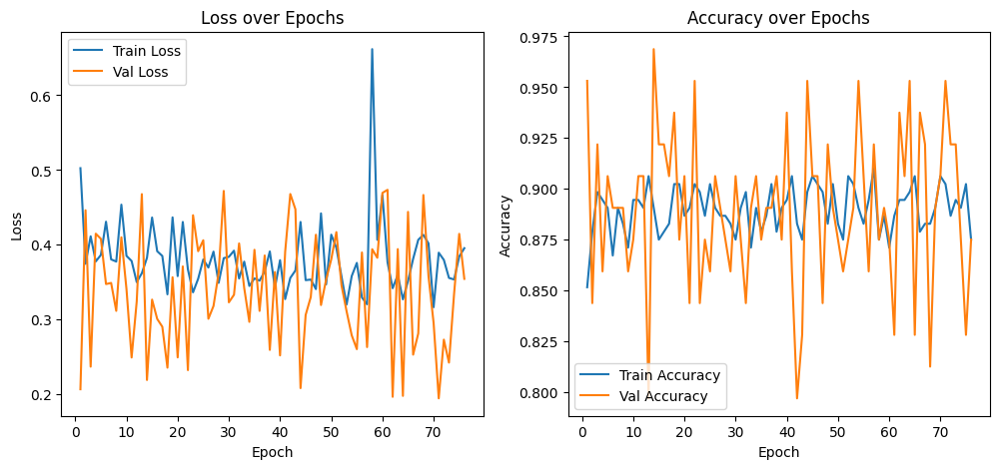

Epoch 77/150
Validation Batch 4/4
Train Loss: 0.3393, Train Accuracy: 0.9023
Validation Loss: 0.2940, Validation Accuracy: 0.9375


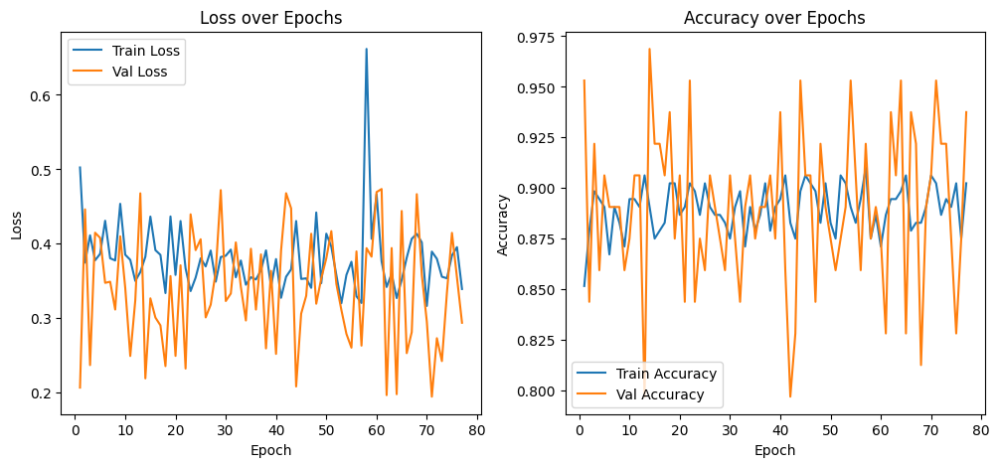

Epoch 78/150
Validation Batch 4/4
Train Loss: 0.3482, Train Accuracy: 0.8945
Validation Loss: 0.3148, Validation Accuracy: 0.8906


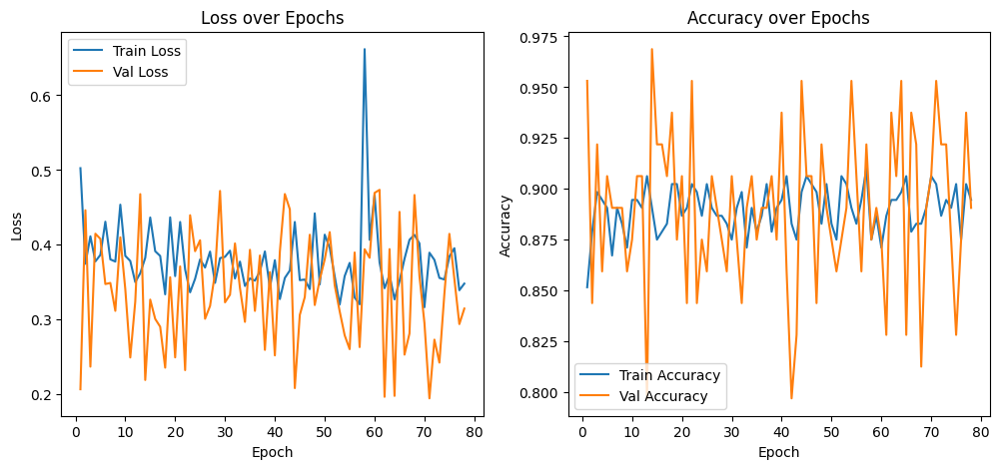

Epoch 79/150
Validation Batch 4/4
Train Loss: 0.3430, Train Accuracy: 0.9062
Validation Loss: 0.3064, Validation Accuracy: 0.9375


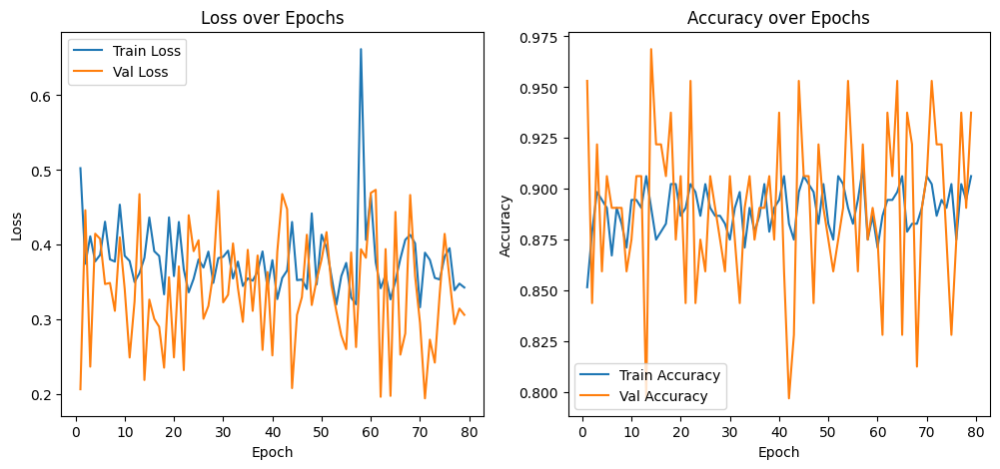

Epoch 80/150
Validation Batch 4/4
Train Loss: 0.3507, Train Accuracy: 0.9023
Validation Loss: 0.3176, Validation Accuracy: 0.9219


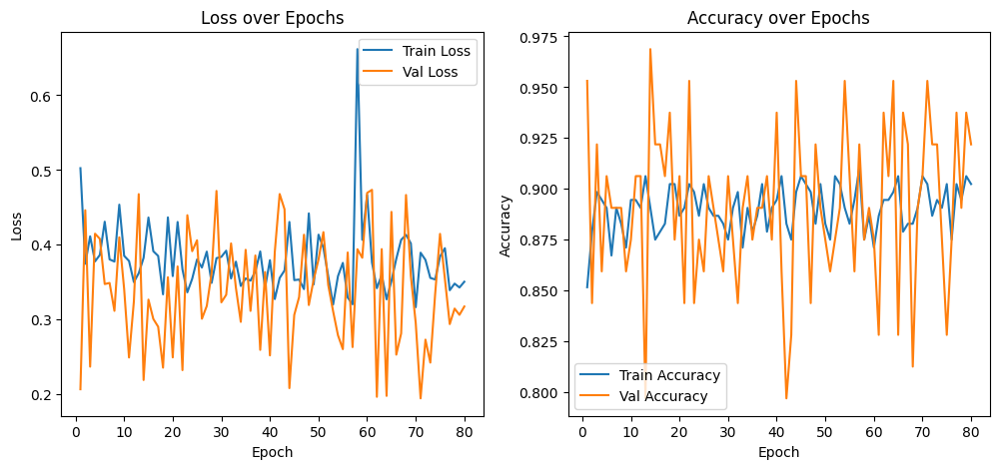

Epoch 81/150
Validation Batch 4/4
Train Loss: 0.3734, Train Accuracy: 0.9023
Validation Loss: 0.4194, Validation Accuracy: 0.8281


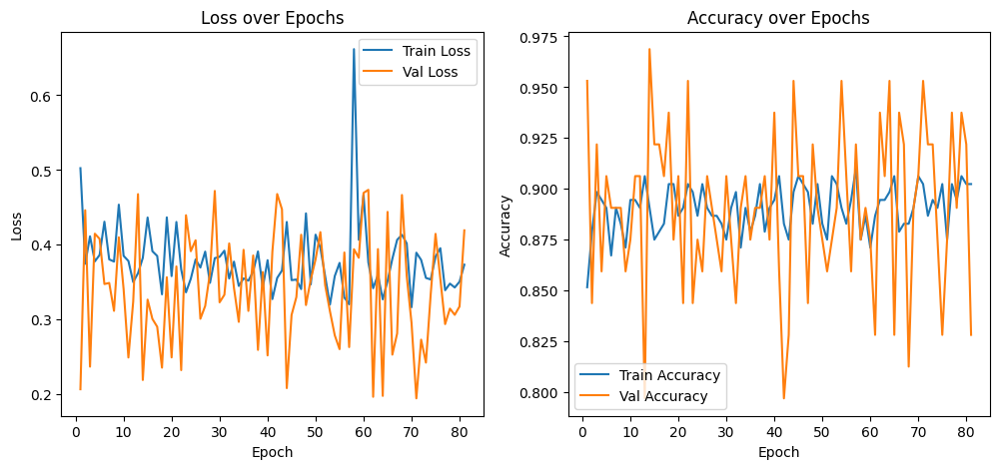

Epoch 82/150
Validation Batch 4/4
Train Loss: 0.3419, Train Accuracy: 0.8867
Validation Loss: 0.5047, Validation Accuracy: 0.8125


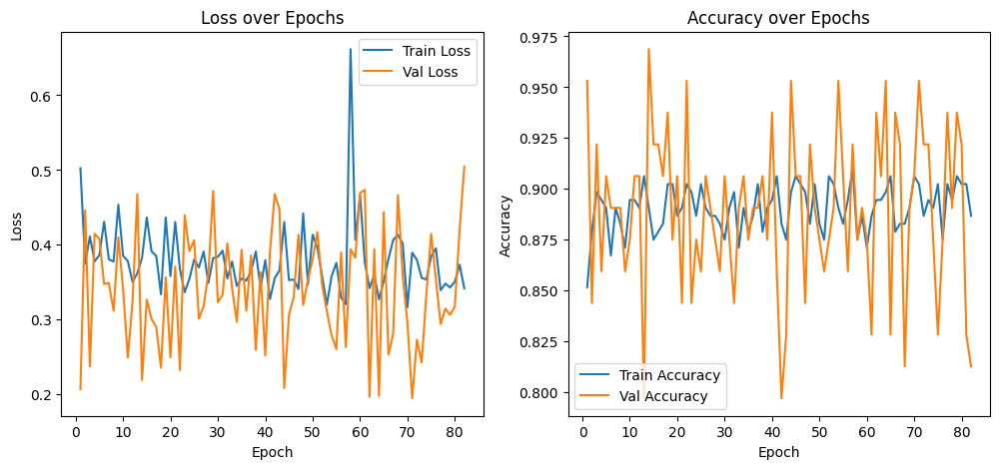

Epoch 83/150
Validation Batch 4/4
Train Loss: 0.3805, Train Accuracy: 0.8945
Validation Loss: 0.3884, Validation Accuracy: 0.8594


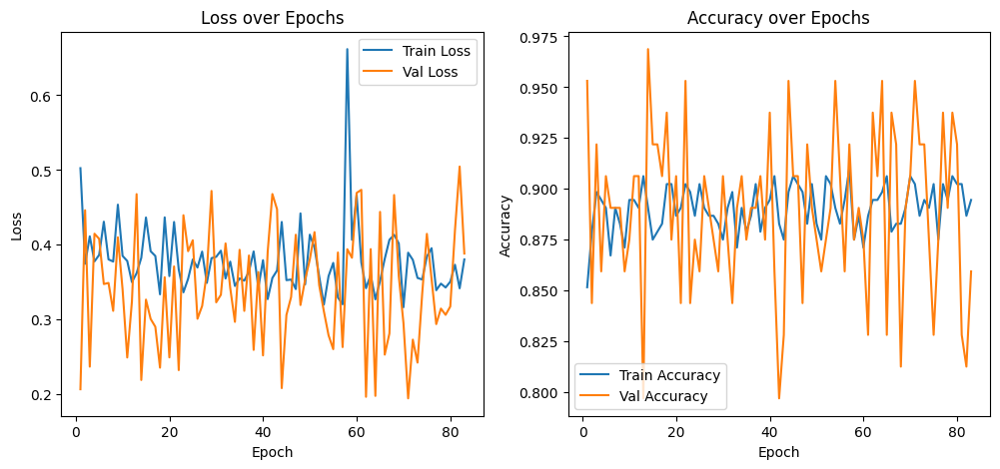

Epoch 84/150
Validation Batch 4/4
Train Loss: 0.3752, Train Accuracy: 0.8984
Validation Loss: 0.2516, Validation Accuracy: 0.9219


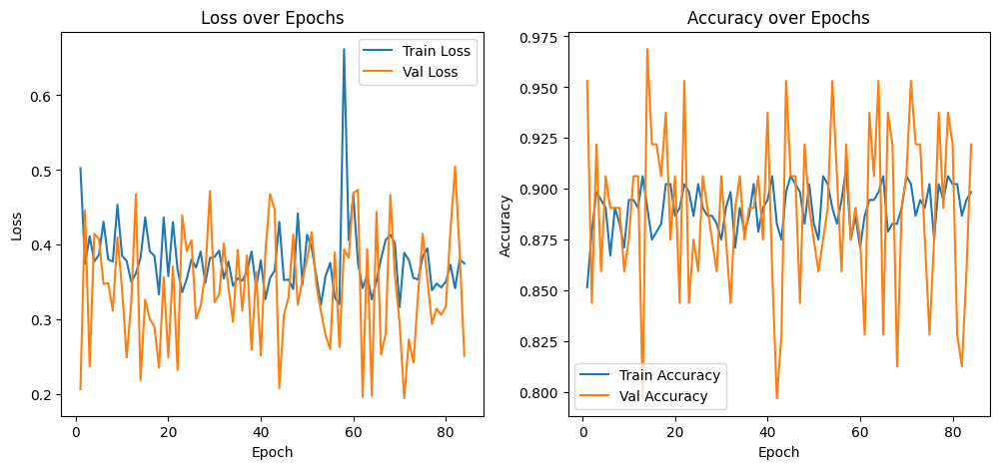

Epoch 85/150
Validation Batch 4/4
Train Loss: 0.3681, Train Accuracy: 0.8828
Validation Loss: 0.3745, Validation Accuracy: 0.8906


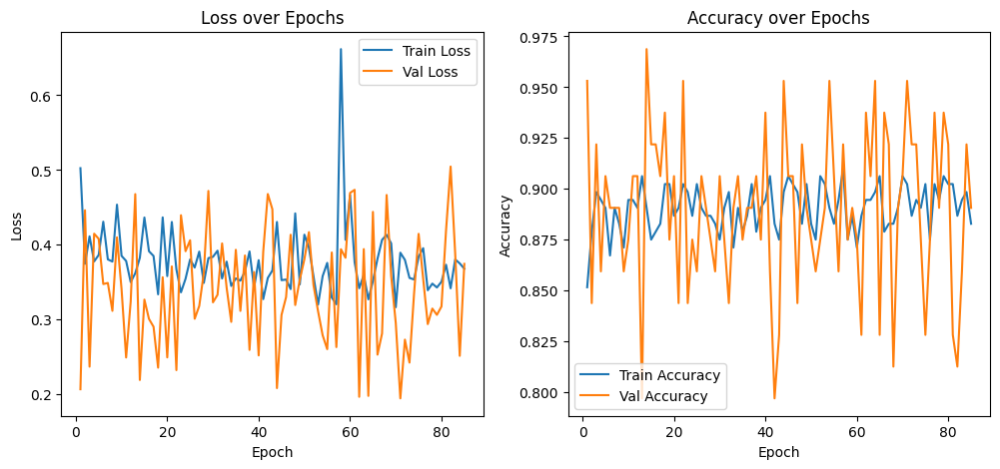

Epoch 86/150
Validation Batch 4/4
Train Loss: 0.3595, Train Accuracy: 0.8984
Validation Loss: 0.3371, Validation Accuracy: 0.8750


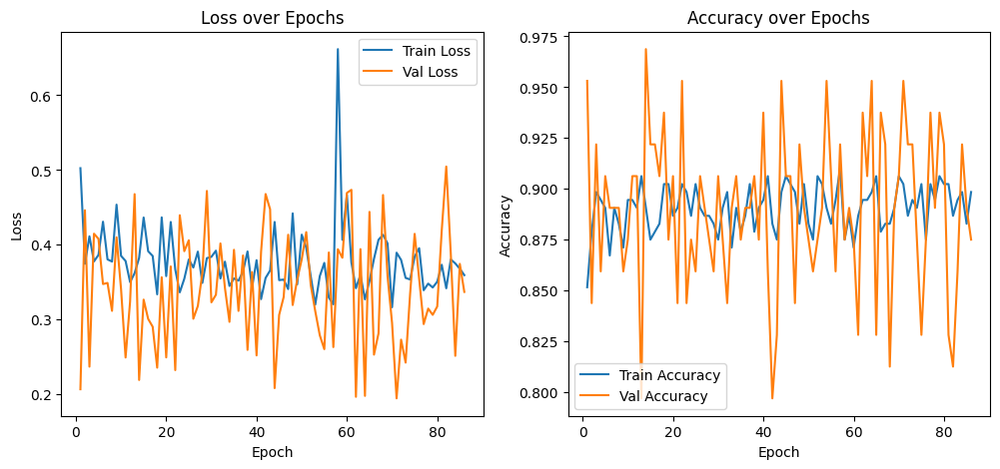

Epoch 87/150
Validation Batch 4/4
Train Loss: 0.4398, Train Accuracy: 0.8906
Validation Loss: 0.4173, Validation Accuracy: 0.8281


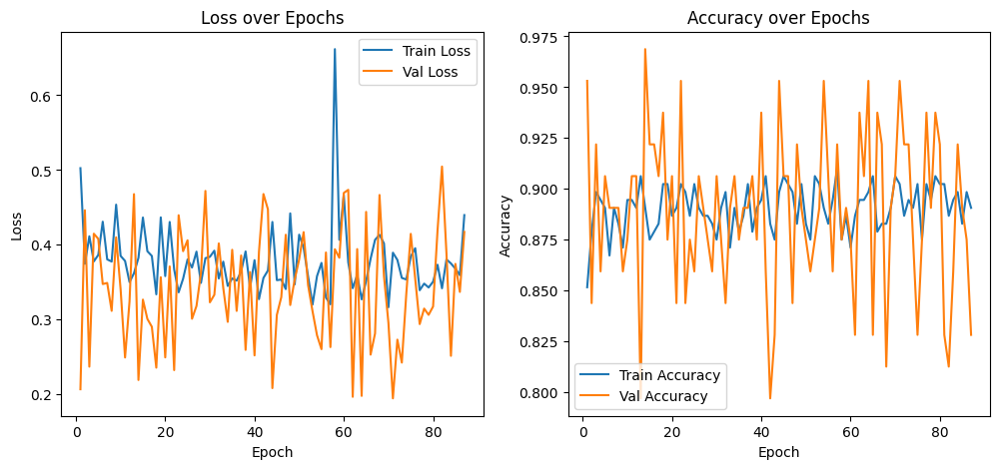

Epoch 88/150
Validation Batch 4/4
Train Loss: 0.3794, Train Accuracy: 0.8828
Validation Loss: 0.3833, Validation Accuracy: 0.8594


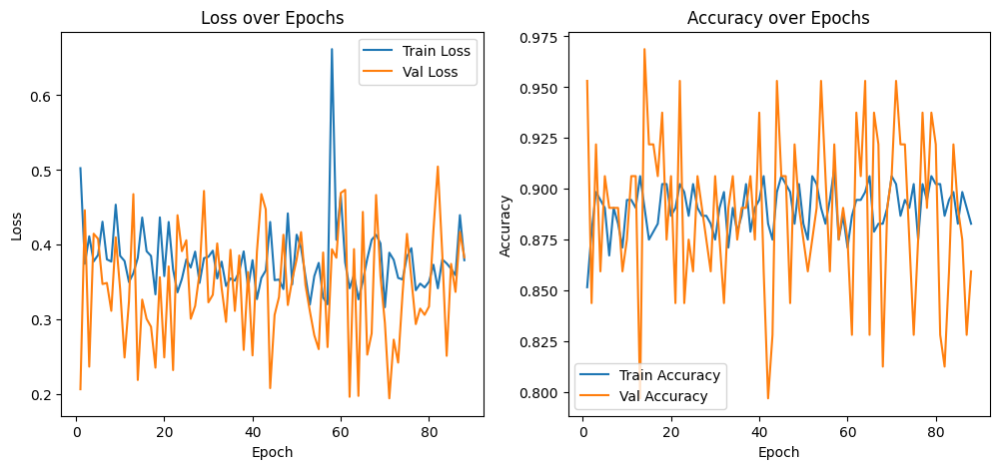

Epoch 89/150
Validation Batch 4/4
Train Loss: 0.3962, Train Accuracy: 0.8945
Validation Loss: 0.3133, Validation Accuracy: 0.9062


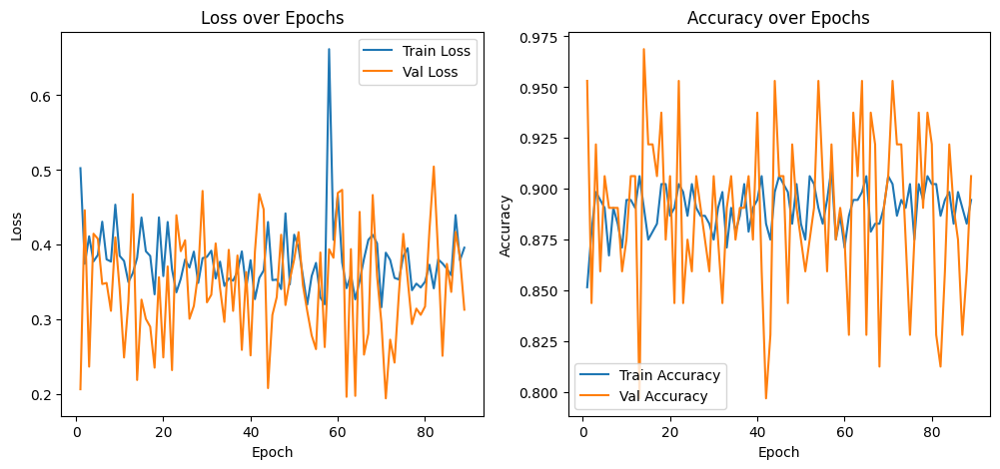

Epoch 90/150
Validation Batch 4/4
Train Loss: 0.4023, Train Accuracy: 0.8828
Validation Loss: 0.4035, Validation Accuracy: 0.8594


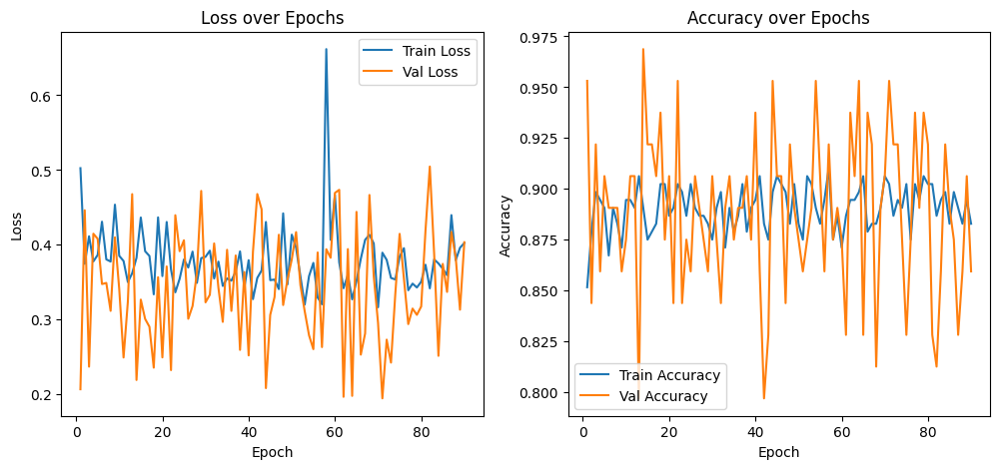

Epoch 91/150
Validation Batch 4/4
Train Loss: 0.3657, Train Accuracy: 0.8906
Validation Loss: 0.2549, Validation Accuracy: 0.9219


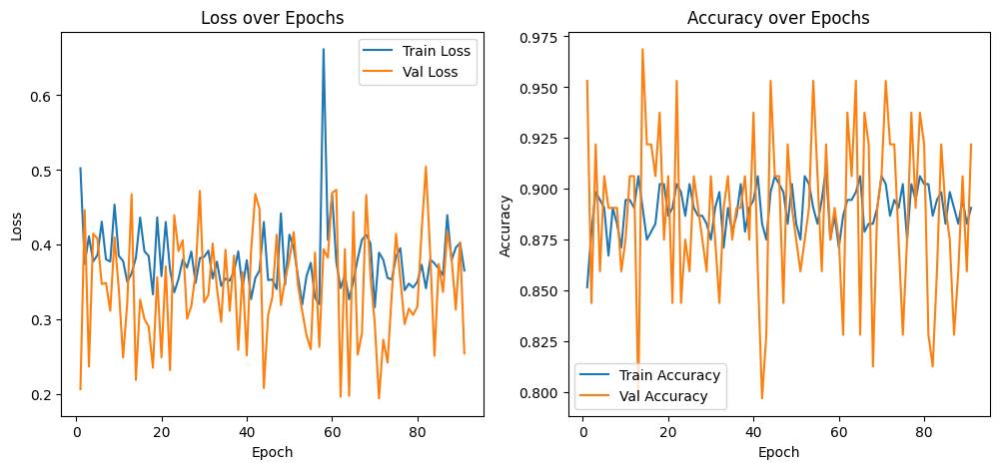

Epoch 92/150
Validation Batch 4/4
Train Loss: 0.3513, Train Accuracy: 0.8828
Validation Loss: 0.1760, Validation Accuracy: 0.9531


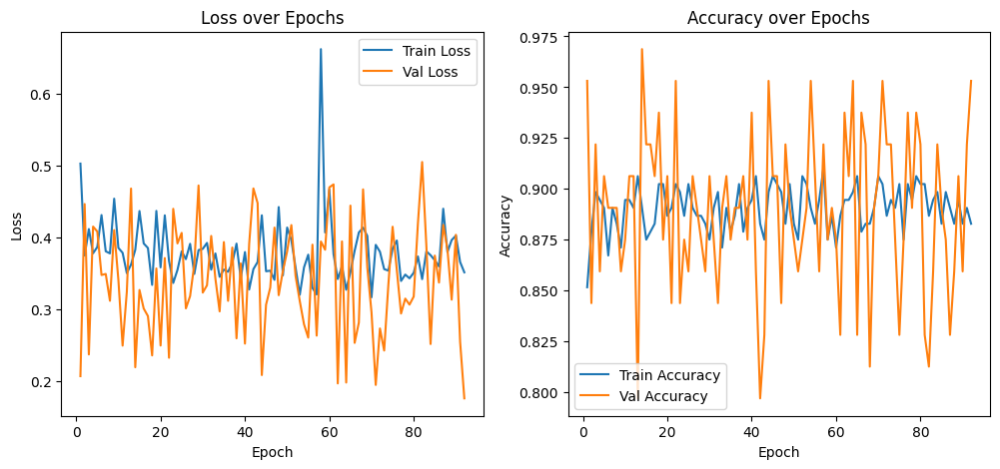

New best model saved to /content/drive/MyDrive/Projects/CNC/CNC_mill/models/best_model_epoch_92.keras
Epoch 93/150
Validation Batch 4/4
Train Loss: 0.3513, Train Accuracy: 0.9062
Validation Loss: 0.5125, Validation Accuracy: 0.8281


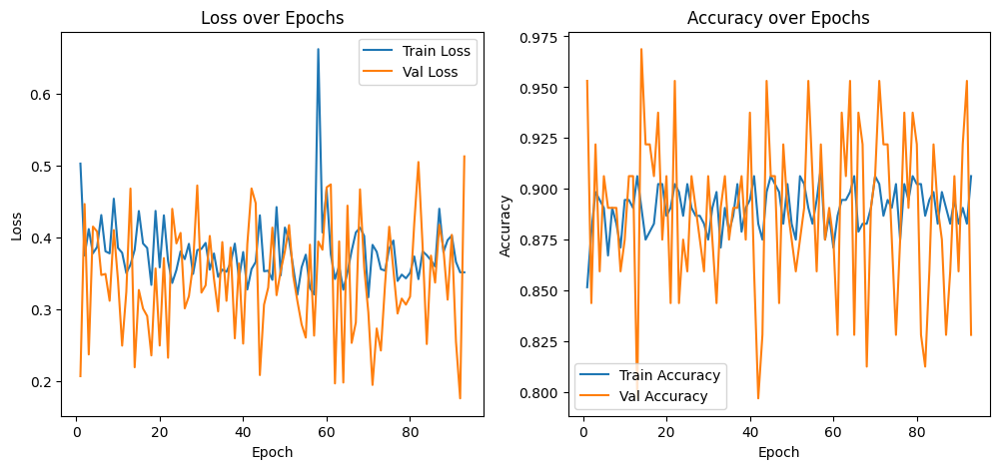

Epoch 94/150
Validation Batch 4/4
Train Loss: 0.3774, Train Accuracy: 0.8906
Validation Loss: 0.2609, Validation Accuracy: 0.9375


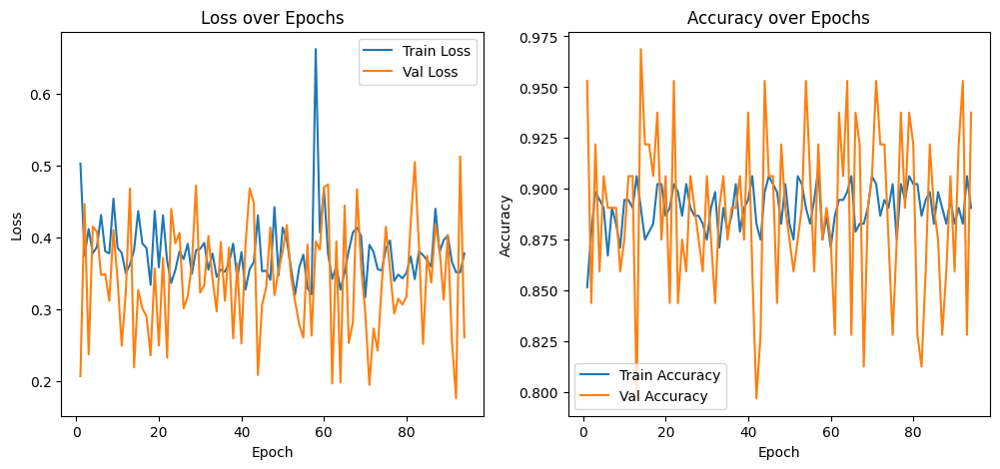

Epoch 95/150
Validation Batch 4/4
Train Loss: 0.3639, Train Accuracy: 0.8945
Validation Loss: 0.4268, Validation Accuracy: 0.8594


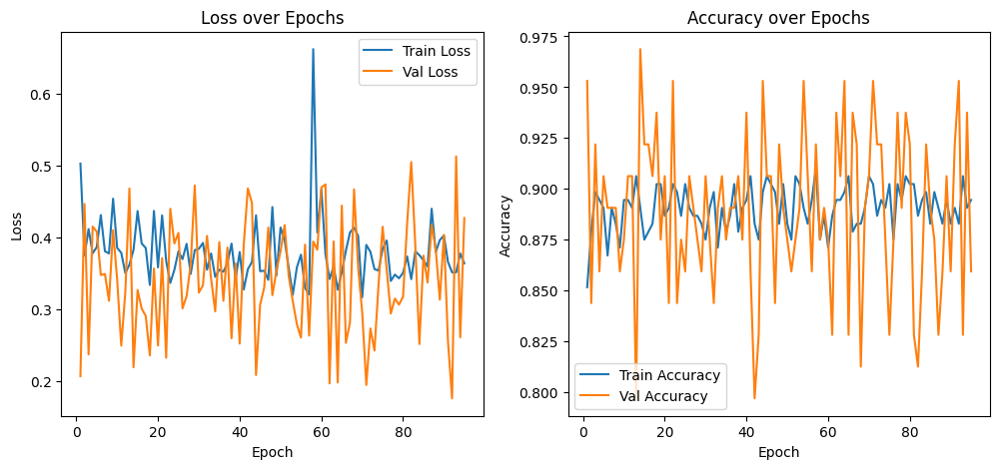

Epoch 96/150
Validation Batch 4/4
Train Loss: 0.3698, Train Accuracy: 0.8867
Validation Loss: 0.2617, Validation Accuracy: 0.9531


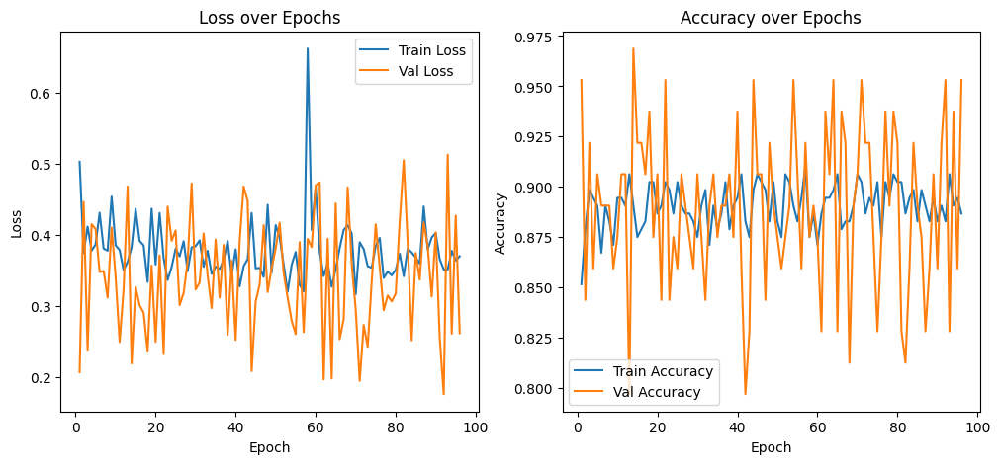

Epoch 97/150
Validation Batch 4/4
Train Loss: 0.3778, Train Accuracy: 0.8984
Validation Loss: 0.2898, Validation Accuracy: 0.9062


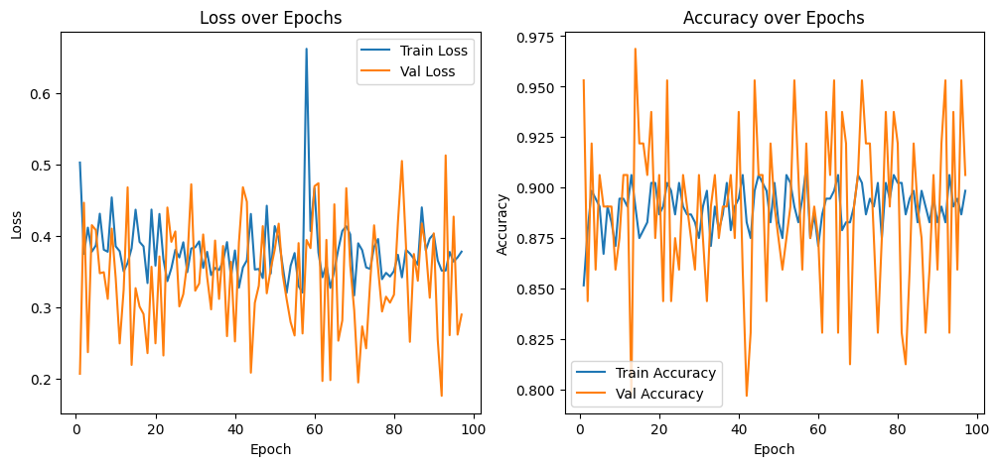

Epoch 98/150
Validation Batch 4/4
Train Loss: 0.3284, Train Accuracy: 0.8984
Validation Loss: 0.3486, Validation Accuracy: 0.9062


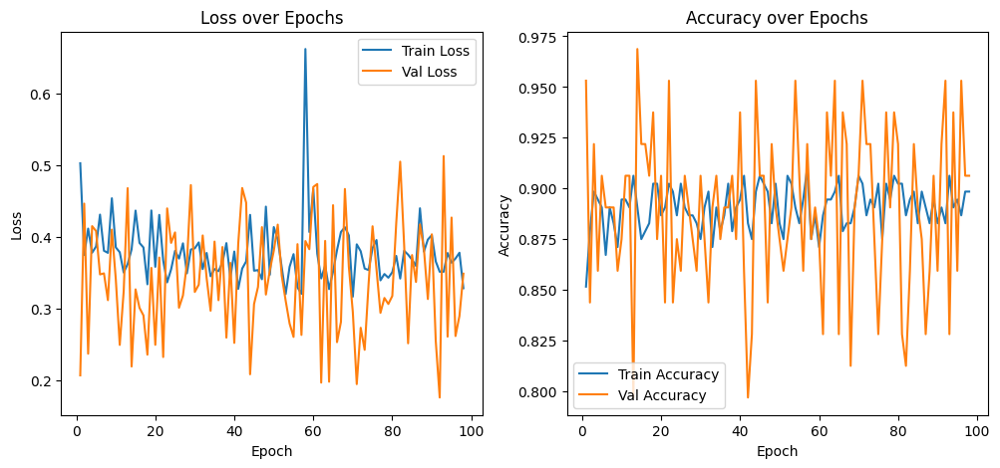

Epoch 99/150
Validation Batch 4/4
Train Loss: 0.3222, Train Accuracy: 0.9062
Validation Loss: 0.2539, Validation Accuracy: 0.9062


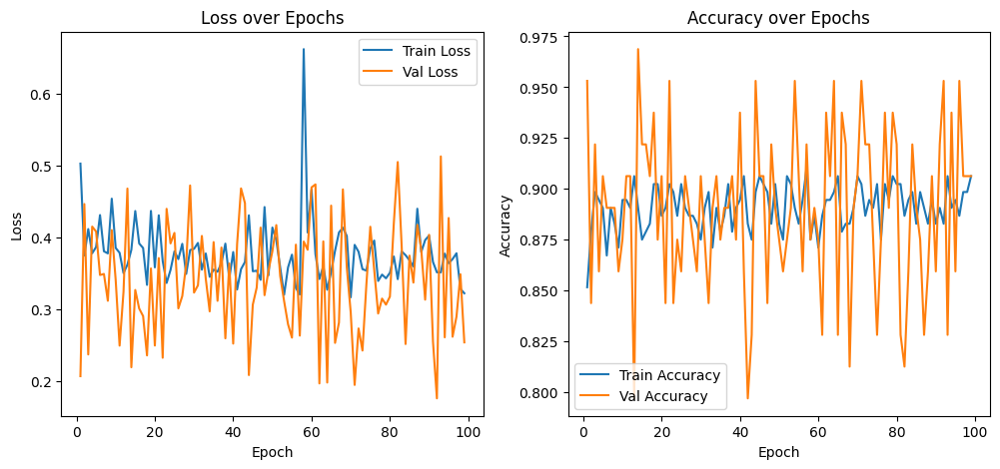

Epoch 100/150
Validation Batch 4/4
Train Loss: 0.4104, Train Accuracy: 0.8750
Validation Loss: 0.3388, Validation Accuracy: 0.8906


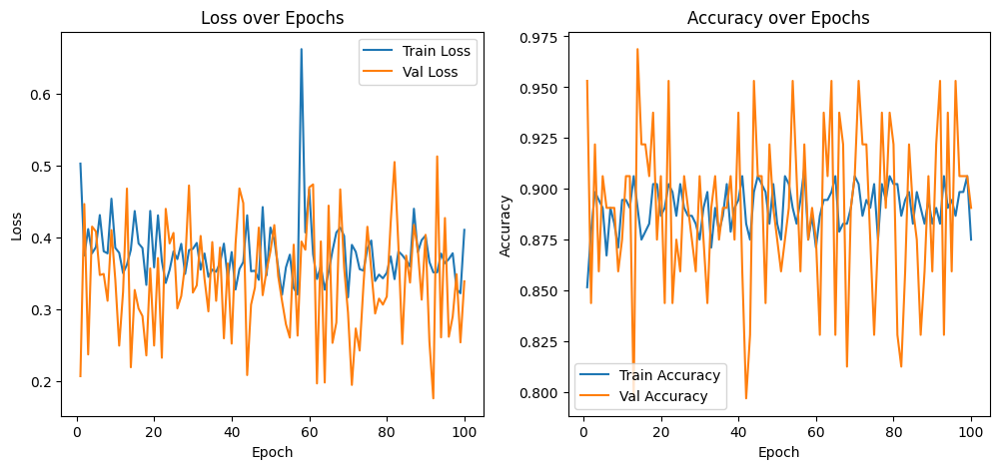

Epoch 101/150
Validation Batch 4/4
Train Loss: 0.3838, Train Accuracy: 0.8945
Validation Loss: 0.3327, Validation Accuracy: 0.8750


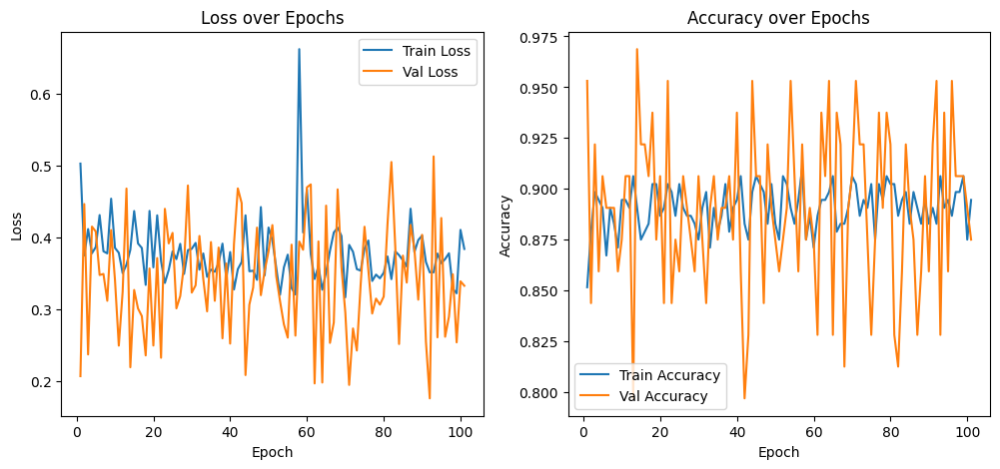

Epoch 102/150
Validation Batch 4/4
Train Loss: 0.3626, Train Accuracy: 0.8984
Validation Loss: 0.3421, Validation Accuracy: 0.8906


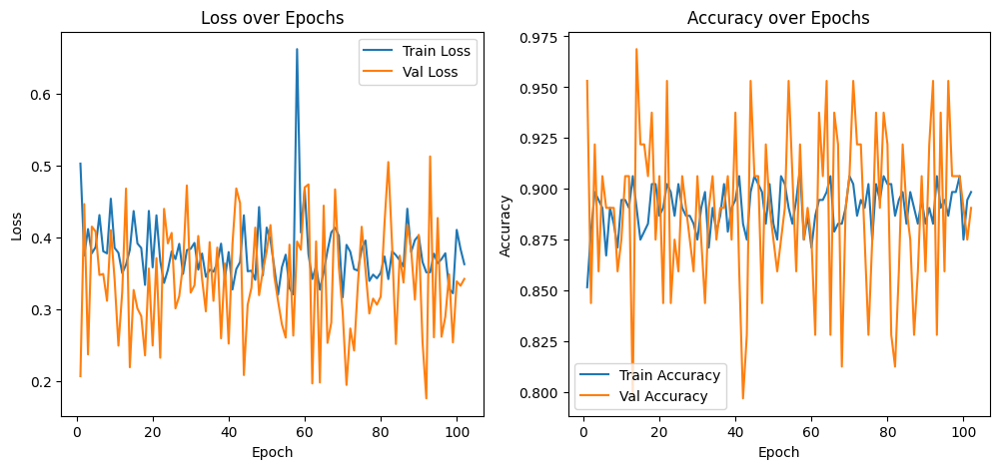

Epoch 103/150
Validation Batch 4/4
Train Loss: 0.3511, Train Accuracy: 0.8984
Validation Loss: 0.2826, Validation Accuracy: 0.9062


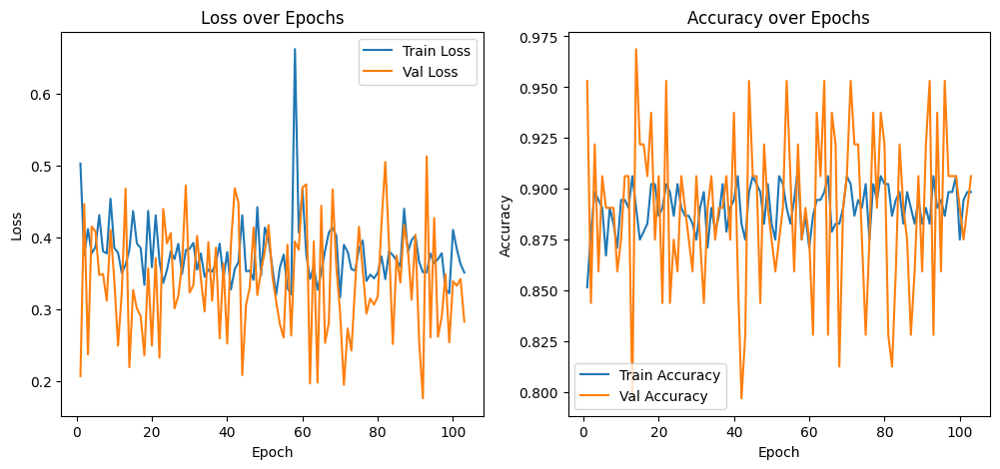

Epoch 104/150
Validation Batch 4/4
Train Loss: 0.3610, Train Accuracy: 0.8672
Validation Loss: 0.3420, Validation Accuracy: 0.9062


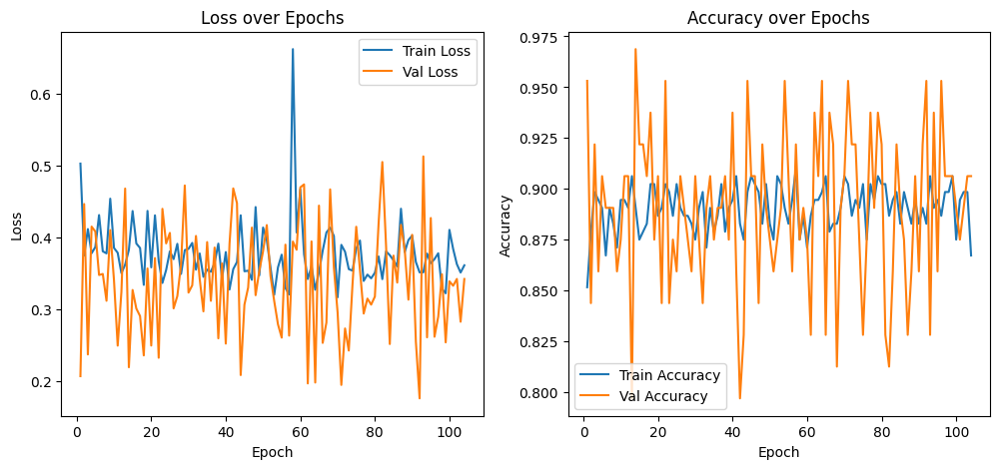

Epoch 105/150
Validation Batch 4/4
Train Loss: 0.3569, Train Accuracy: 0.8945
Validation Loss: 0.3598, Validation Accuracy: 0.8750


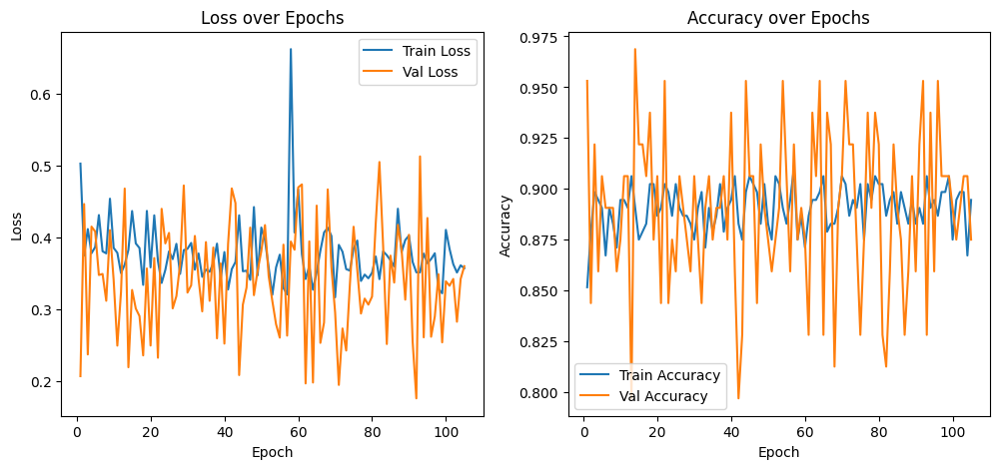

Epoch 106/150
Validation Batch 4/4
Train Loss: 0.3236, Train Accuracy: 0.9062
Validation Loss: 0.2707, Validation Accuracy: 0.9219


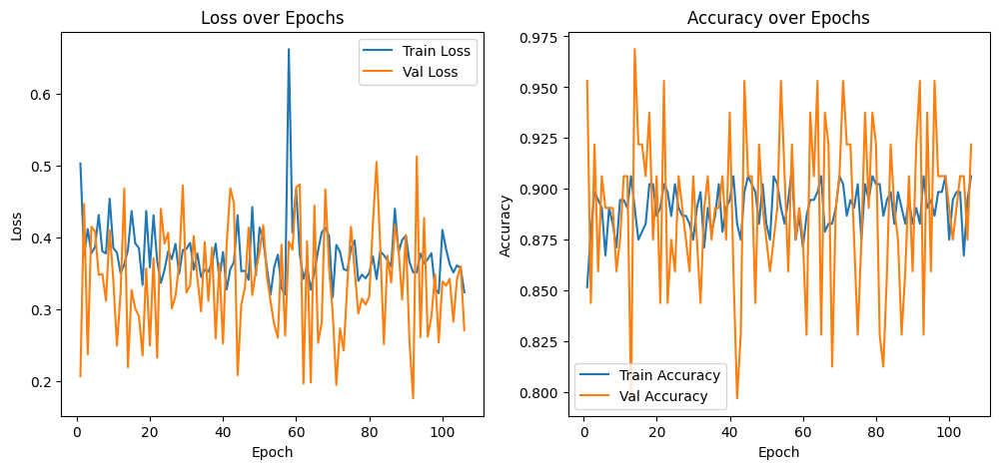

Epoch 107/150
Validation Batch 4/4
Train Loss: 0.3922, Train Accuracy: 0.8750
Validation Loss: 0.4713, Validation Accuracy: 0.8125


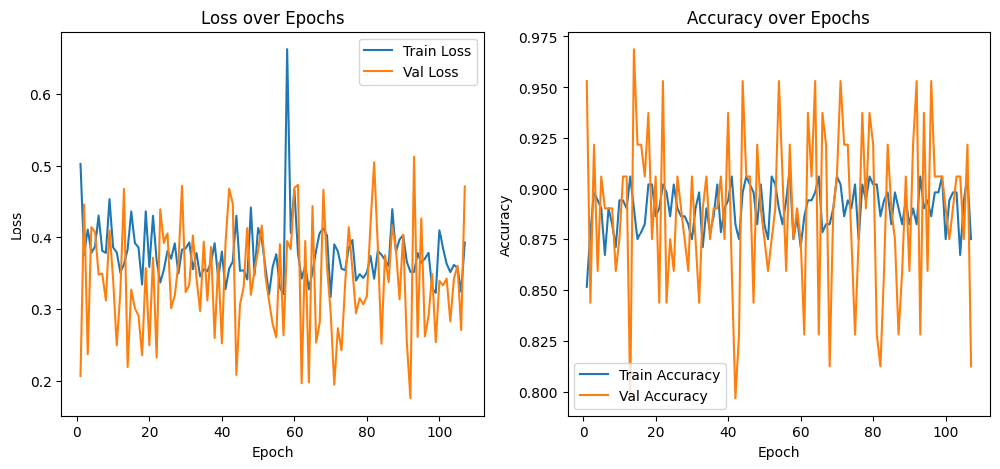

Epoch 108/150
Validation Batch 4/4
Train Loss: 0.3694, Train Accuracy: 0.8828
Validation Loss: 0.3171, Validation Accuracy: 0.8906


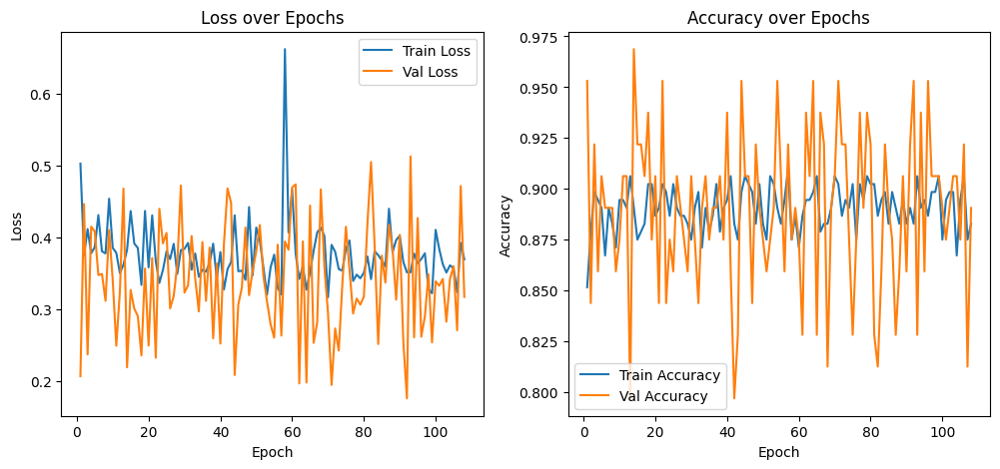

Epoch 109/150
Validation Batch 4/4
Train Loss: 0.3156, Train Accuracy: 0.9023
Validation Loss: 0.2662, Validation Accuracy: 0.9219


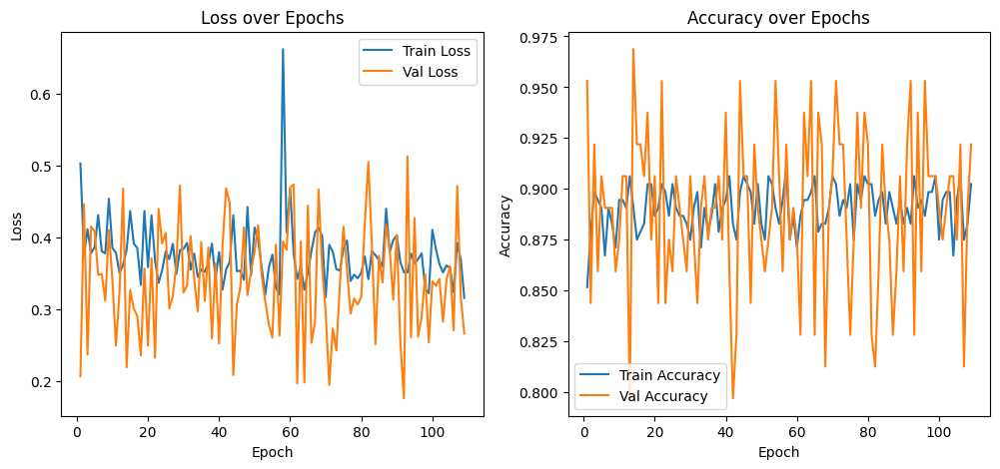

Epoch 110/150
Validation Batch 4/4
Train Loss: 0.3790, Train Accuracy: 0.8789
Validation Loss: 0.2833, Validation Accuracy: 0.9531


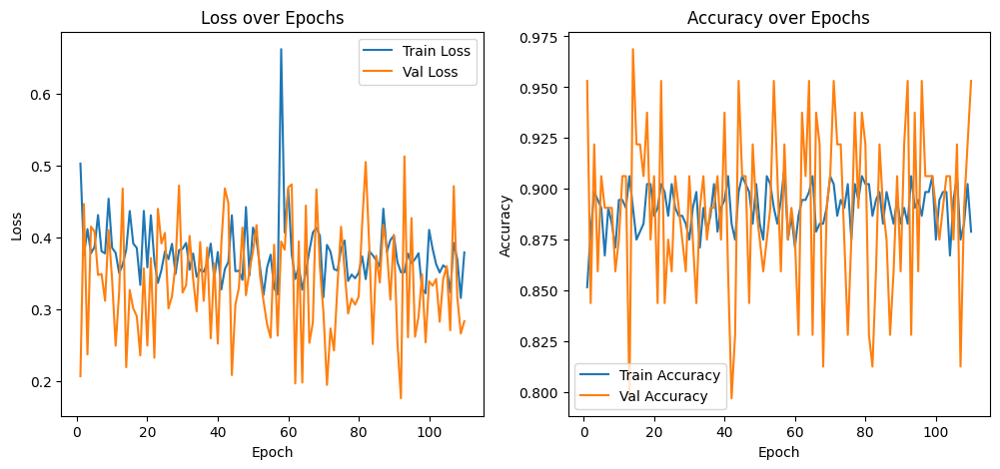

Epoch 111/150
Validation Batch 4/4
Train Loss: 0.3341, Train Accuracy: 0.9141
Validation Loss: 0.3049, Validation Accuracy: 0.9062


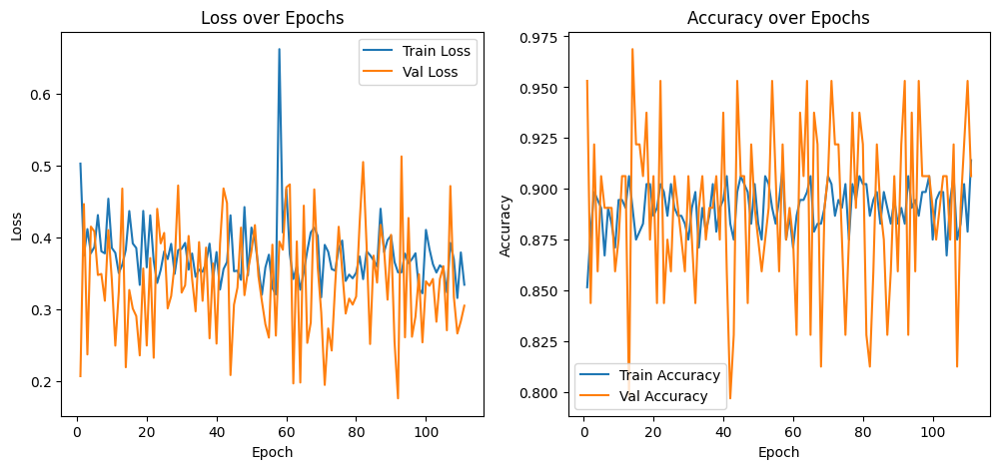

Epoch 112/150
Validation Batch 4/4
Train Loss: 0.3324, Train Accuracy: 0.8984
Validation Loss: 0.3992, Validation Accuracy: 0.8438


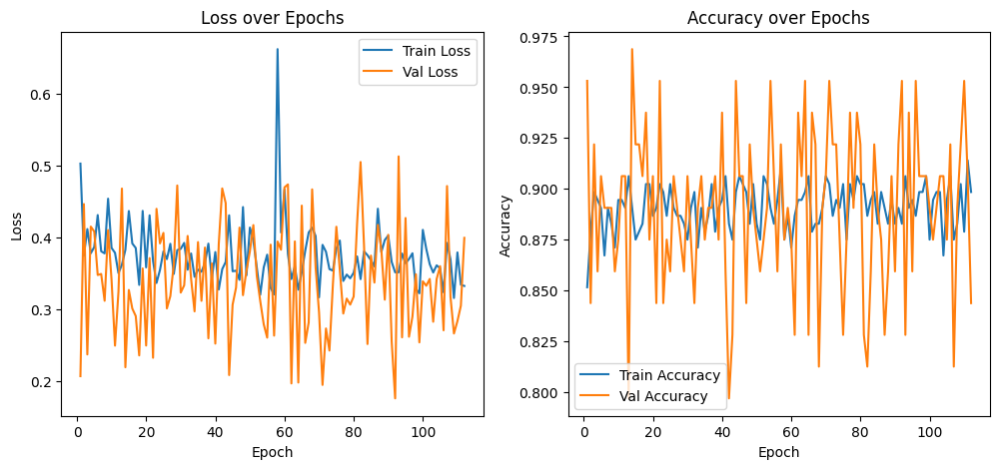

Epoch 113/150
Validation Batch 4/4
Train Loss: 0.3773, Train Accuracy: 0.8789
Validation Loss: 0.4845, Validation Accuracy: 0.8125


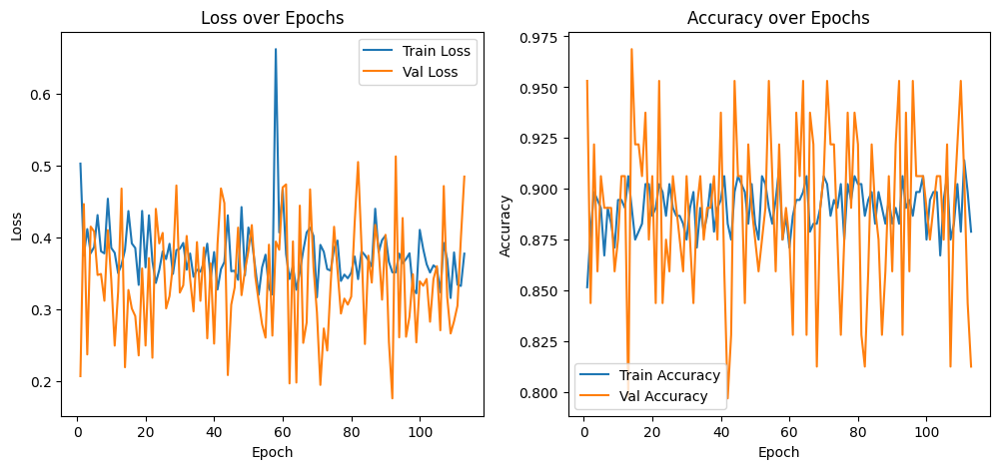

Epoch 114/150
Validation Batch 4/4
Train Loss: 0.4080, Train Accuracy: 0.8945
Validation Loss: 0.3130, Validation Accuracy: 0.9375


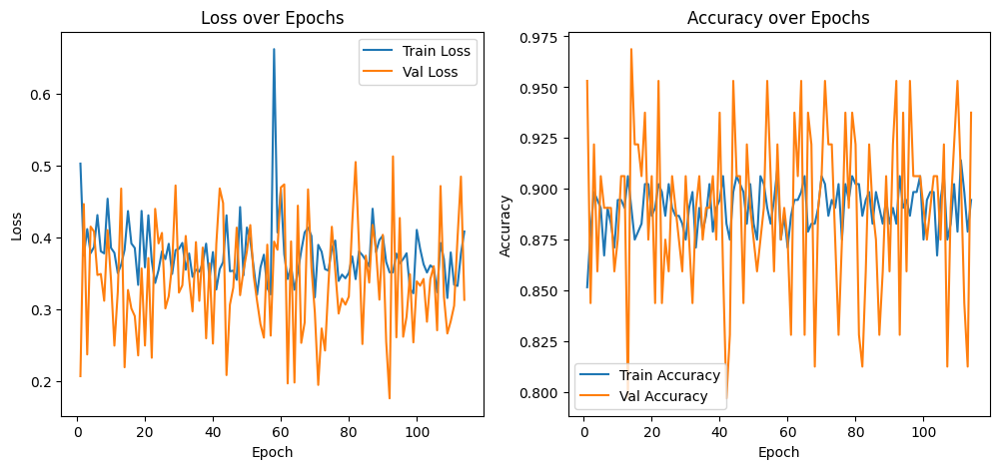

Epoch 115/150
Validation Batch 4/4
Train Loss: 0.3775, Train Accuracy: 0.8828
Validation Loss: 0.2763, Validation Accuracy: 0.9219


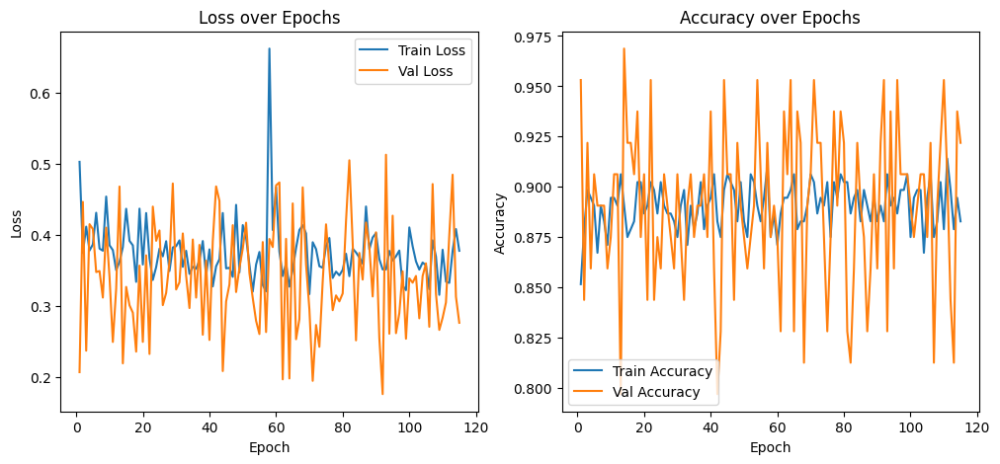

Epoch 116/150
Validation Batch 4/4
Train Loss: 0.3599, Train Accuracy: 0.8867
Validation Loss: 0.4730, Validation Accuracy: 0.8125


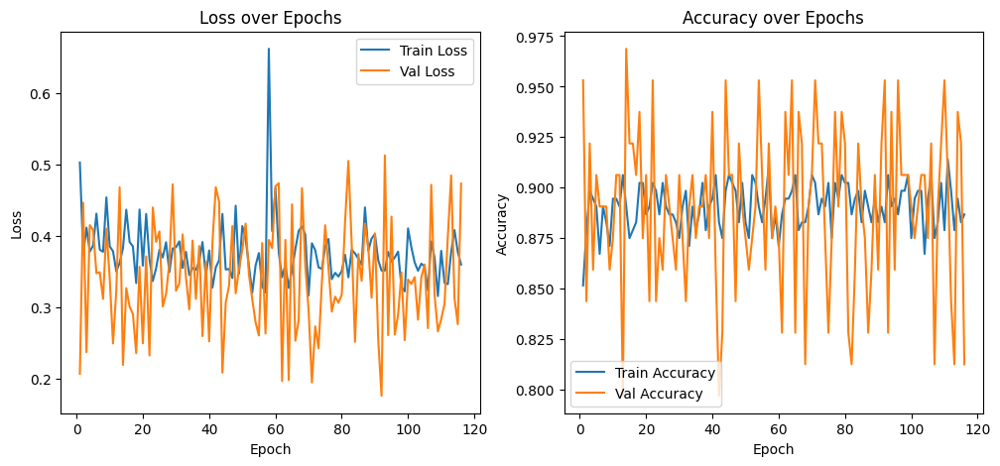

Epoch 117/150
Validation Batch 4/4
Train Loss: 0.3557, Train Accuracy: 0.8945
Validation Loss: 0.2699, Validation Accuracy: 0.9219


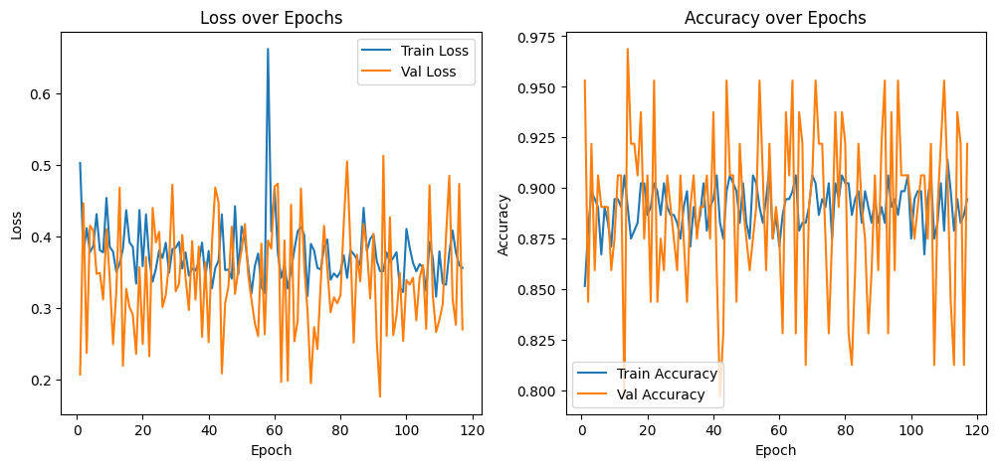

Epoch 118/150


In [ ]:
# Define epochs and steps per epoch
epochs = 150

optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.001)

models_folder = '/content/drive/MyDrive/Projects/CNC/CNC_mill/models'

# Initialize metrics to track loss and accuracy
train_loss_metric = tf.keras.metrics.Mean(name="train_loss")
train_accuracy_metric = tf.keras.metrics.BinaryAccuracy(name="train_accuracy")
val_loss_metric = tf.keras.metrics.Mean(name="val_loss")
val_accuracy_metric = tf.keras.metrics.BinaryAccuracy(name="val_accuracy")

# Initialize lists to store metrics over epochs
train_loss_history = []
train_accuracy_history = []
val_loss_history = []
val_accuracy_history = []

# Training function
@tf.function
def train_step(inputs, targets):
    with tf.GradientTape() as tape:
        predictions = model(inputs, training=True)  # Forward pass
        loss = tf.keras.losses.binary_crossentropy(targets, predictions)  # Compute loss
    gradients = tape.gradient(loss, model.trainable_variables)  # Backward pass
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))  # Update weights

    # Update metrics
    train_loss_metric.update_state(loss)
    train_accuracy_metric.update_state(targets, predictions)

# Validation function
@tf.function
def val_step(inputs, targets):
    predictions = model(inputs, training=False)  # Forward pass
    loss = tf.keras.losses.binary_crossentropy(targets, predictions)  # Compute loss

    # Update metrics
    val_loss_metric.update_state(loss)
    val_accuracy_metric.update_state(targets, predictions)

# Define the models folder path
models_folder = '/content/drive/MyDrive/Projects/CNC/CNC_mill/models'
os.makedirs(models_folder, exist_ok=True)  # Create folder if it doesn't exist

# Initialize variable to track the best validation loss
best_val_loss = float('inf')

# Training loop
for epoch in range(epochs):
    # Clear the terminal
    print(f"Epoch {epoch + 1}/{epochs}")

    # Reset metrics at the start of each epoch
    train_loss_metric.reset_state()
    train_accuracy_metric.reset_state()
    val_loss_metric.reset_state()
    val_accuracy_metric.reset_state()

    # Train over the batches
    total_train_batches = len(train_dataset)
    for batch_idx, (inputs, targets) in enumerate(train_dataset, start=1):
        train_step(inputs, targets)
        print(f"Training Batch {batch_idx}/{total_train_batches}", end="\r")

    # Validate over the batches
    total_val_batches = len(val_dataset)
    for batch_idx, (val_inputs, val_targets) in enumerate(val_dataset, start=1):
        val_step(val_inputs, val_targets)
        print(f"Validation Batch {batch_idx}/{total_val_batches}", end="\r")

    # Print epoch metrics
    print()  # Move to a new line after progress
    train_loss = train_loss_metric.result()
    train_accuracy = train_accuracy_metric.result()
    val_loss = val_loss_metric.result()
    val_accuracy = val_accuracy_metric.result()
    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
    print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")

    # Append metrics to history
    train_loss_history.append(train_loss.numpy())
    train_accuracy_history.append(train_accuracy.numpy())
    val_loss_history.append(val_loss.numpy())
    val_accuracy_history.append(val_accuracy.numpy())

    # Plot the metrics
    epochs_range = range(1, epoch + 2)  # Epochs start from 1

    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_loss_history, label='Train Loss')
    plt.plot(epochs_range, val_loss_history, label='Val Loss')
    plt.title('Loss over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracy_history, label='Train Accuracy')
    plt.plot(epochs_range, val_accuracy_history, label='Val Accuracy')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.show()

    # Save the model if it performs better
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        model_path = os.path.join(models_folder, f"best_model_epoch_{epoch + 1:02d}.keras")
        model.save(model_path)
        print(f"New best model saved to {model_path}")
